<a href="https://colab.research.google.com/github/Danielrouach/Statistical-Learning-Project/blob/main/Statistical_Learning_Project_2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import

In [13]:
# Core libraries
import numpy as np
import pandas as pd
import re

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Statsmodels
import statsmodels.api as sm
from statsmodels.api import OLS

# Scikit-learn: preprocessing
from sklearn.preprocessing import StandardScaler

# Scikit-learn: model selection
from sklearn.model_selection import KFold, train_test_split
import sklearn.model_selection as skm  # if needed for specific functions

# Scikit-learn: regression models
from sklearn.linear_model import LassoCV, RidgeCV, Ridge, Lasso
from sklearn.linear_model import LinearRegression  # if needed
import sklearn.linear_model as skl  # if needed for generic access

# Scikit-learn: metrics
from sklearn.metrics import mean_squared_error, r2_score

# Scikit-learn: decomposition and PLS
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression

# Scikit-learn: ensemble and tree-based models
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

# Dataset creation (for synthetic examples)
from sklearn.datasets import make_regression

# Optional external packages (commented if not installed)
# from ISLP.models import Stepwise, sklearn_selected, sklearn_selection_path
# from l0bnb import fit_path


# Load data

In [14]:
# from google.colab import drive
# drive.mount('/content/drive')

In [15]:
##Load the dataset:
df_partial = pd.read_csv("/content/content_output (1).csv",nrows = 70000,on_bad_lines='skip')
#60083
df_partial.head()

,action,observation.state,timestamp,frame_index,episode_index,index,task_index
0,[ 0.05824046 0.10764965 -0.10220728 -0.067425...,[ 2.2115414e-01 4.7975525e-02 -5.0000045e-03 ...,0.000000,0,0,0,0
1,[ 0.05823839 0.1076455 -0.10220364 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.033333,1,0,1,0
2,[ 0.05823861 0.10764543 -0.10220361 -0.067423...,[ 2.2115414e-01 4.7975525e-02 -5.0000045e-03 ...,0.066667,2,0,2,0
3,[ 0.05823857 0.1076457 -0.10220358 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.100000,3,0,3,0
4,[ 0.0582385 0.10764579 -0.10220346 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.133333,4,0,4,0



--- Frames per Episode (Head) ---
   episode_index  num_frames
0              0          91
1              1          88
2              2          83
3              3          59
4              4          87


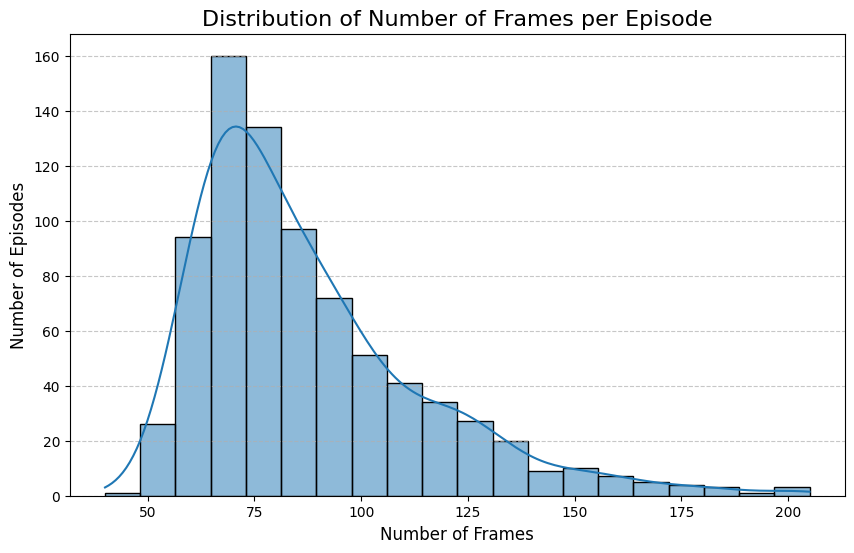


--- Histogram Generated ---
Minimum frames per episode: 40
Maximum frames per episode: 205
Average frames per episode: 87.61
Median frames per episode: 80.0


In [16]:
# --- Calculate frames per episode ---
# Group by 'episode_index' and count the number of rows (frames) in each group
frames_per_episode = df_partial.groupby('episode_index').size().reset_index(name='num_frames')

print("\n--- Frames per Episode (Head) ---")
print(frames_per_episode.head())

# --- Plotting the histogram ---
plt.figure(figsize=(10, 6))
sns.histplot(frames_per_episode['num_frames'], bins=20, kde=True) # kde=True adds a density curve
plt.title('Distribution of Number of Frames per Episode', fontsize=16)
plt.xlabel('Number of Frames', fontsize=12)
plt.ylabel('Number of Episodes', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

print("\n--- Histogram Generated ---")
print(f"Minimum frames per episode: {frames_per_episode['num_frames'].min()}")
print(f"Maximum frames per episode: {frames_per_episode['num_frames'].max()}")
print(f"Average frames per episode: {frames_per_episode['num_frames'].mean():.2f}")
print(f"Median frames per episode: {frames_per_episode['num_frames'].median()}")

In [17]:
df_partial.shape

(70000, 7)

In [18]:
YY = df_partial.groupby('episode_index')['timestamp'].max().reset_index()

YY['timestamp'].describe()

,timestamp
count,799.000000
mean,2.886984
std,0.892833
min,1.300000
25%,2.233333
50%,2.633333
75%,3.266667
max,6.800000


In [19]:
# keep only first n frames of each episode
frames_to_keep = 30
df_partial = df_partial.groupby('episode_index').head(frames_to_keep).reset_index(drop=True)

In [20]:
df_partial

,action,observation.state,timestamp,frame_index,episode_index,index,task_index
0,[ 0.05824046 0.10764965 -0.10220728 -0.067425...,[ 2.2115414e-01 4.7975525e-02 -5.0000045e-03 ...,0.000000,0,0,0,0
1,[ 0.05823839 0.1076455 -0.10220364 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.033333,1,0,1,0
2,[ 0.05823861 0.10764543 -0.10220361 -0.067423...,[ 2.2115414e-01 4.7975525e-02 -5.0000045e-03 ...,0.066667,2,0,2,0
3,[ 0.05823857 0.1076457 -0.10220358 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.100000,3,0,3,0
4,[ 0.0582385 0.10764579 -0.10220346 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.133333,4,0,4,0
...,...,...,...,...,...,...,...
23965,[-0.03380337 0.20790975 0.08028203 0.183898...,[ 5.2443016e-01 1.5008159e-01 -5.0000120e-03 ...,0.833333,25,798,69985,0
23966,[-0.03380083 0.20790912 0.08028205 0.183899...,[ 5.2443016e-01 1.5008159e-01 -5.0000120e-03 ...,0.866667,26,798,69986,0
23967,[-0.03379796 0.20790882 0.08028258 0.183899...,[ 5.24430156e-01 1.50081590e-01 -5.00001200e-...,0.900000,27,798,69987,0
23968,[-0.03379474 0.20790802 0.08028261 0.183898...,[ 5.2443016e-01 1.5008159e-01 -5.0000120e-03 ...,0.933333,28,798,69988,0


# Preproccessing

In [21]:
df_partial['frame_index'] = df_partial['frame_index'].astype(int)
df_partial['episode_index'] = df_partial['episode_index'].astype(int)

Convert the action column to features columns

In [22]:
# Function to convert string representation to array
def convert_to_array(text):
    if isinstance(text, (list, np.ndarray)):
        return text

    # Remove brackets and split by spaces or commas
    if isinstance(text, str):
        # Clean the string and extract numbers
        text = text.strip('[]')
        # Split by spaces or commas, handling multiple spaces
        values = re.split(r'[\s,]+', text.strip())
        # Convert to float, filtering out empty strings
        values = [float(val) for val in values if val]
        return values

    return text

# Apply conversion to action column
df_partial['action_array'] = df_partial['action'].apply(convert_to_array)

# Check if conversion worked
print("First converted action:", df_partial['action_array'].iloc[0])
print("Type:", type(df_partial['action_array'].iloc[0]))

# Get number of coordinates from first valid row
sample_idx = 0
while sample_idx < len(df_partial) and not isinstance(df_partial['action_array'].iloc[sample_idx], (list, np.ndarray)):
    sample_idx += 1

if sample_idx < len(df_partial):
    num_action_coords = len(df_partial['action_array'].iloc[sample_idx])
    print(f"Number of coordinates: {num_action_coords}")

    # Create new columns for each action coordinate
    for i in range(num_action_coords):
        col_name = f'joint_delta_pos_{i}'
        df_partial[col_name] = df_partial['action_array'].apply(lambda x: x[i] if isinstance(x, (list, np.ndarray)) and i < len(x) else None)

df_partial.head()

First converted action: [0.05824046, 0.10764965, -0.10220728, -0.06742571, 0.2495161, -0.13372773, 0.11292724, 0.0]
Type: <class 'list'>
Number of coordinates: 8


,action,observation.state,timestamp,frame_index,episode_index,index,task_index,action_array,joint_delta_pos_0,joint_delta_pos_1,joint_delta_pos_2,joint_delta_pos_3,joint_delta_pos_4,joint_delta_pos_5,joint_delta_pos_6,joint_delta_pos_7
0,[ 0.05824046 0.10764965 -0.10220728 -0.067425...,[ 2.2115414e-01 4.7975525e-02 -5.0000045e-03 ...,0.000000,0,0,0,0,"[0.05824046, 0.10764965, -0.10220728, -0.06742...",0.058240,0.107650,-0.102207,-0.067426,0.249516,-0.133728,0.112927,0.0
1,[ 0.05823839 0.1076455 -0.10220364 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.033333,1,0,1,0,"[0.05823839, 0.1076455, -0.10220364, -0.067423...",0.058238,0.107646,-0.102204,-0.067423,0.249507,-0.133721,0.112923,0.0
2,[ 0.05823861 0.10764543 -0.10220361 -0.067423...,[ 2.2115414e-01 4.7975525e-02 -5.0000045e-03 ...,0.066667,2,0,2,0,"[0.05823861, 0.10764543, -0.10220361, -0.06742...",0.058239,0.107645,-0.102204,-0.067423,0.249500,-0.133722,0.112930,0.0
3,[ 0.05823857 0.1076457 -0.10220358 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.100000,3,0,3,0,"[0.05823857, 0.1076457, -0.10220358, -0.067423...",0.058239,0.107646,-0.102204,-0.067423,0.249500,-0.133722,0.112930,0.0
4,[ 0.0582385 0.10764579 -0.10220346 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.133333,4,0,4,0,"[0.0582385, 0.10764579, -0.10220346, -0.067423...",0.058238,0.107646,-0.102203,-0.067423,0.249501,-0.133722,0.112929,0.0


In [23]:
# Get all columns that start with 'joint_delta_pos'
delta_pos_columns = [col for col in df_partial.columns if col.startswith('joint_delta_pos')]

# Calculate the norm (square root of sum of squares)
df_partial['joint_delta_pos_norm'] = np.sqrt(
    np.sum(df_partial[delta_pos_columns] ** 2, axis=1)
)

Convert the observation column to features columns

In [24]:
# Apply the same conversion to observation.state column
df_partial['observation_state_array'] = df_partial['observation.state'].apply(convert_to_array)

# Check if conversion worked
print("First converted observation state:", df_partial['observation_state_array'].iloc[0])
print("Type:", type(df_partial['observation_state_array'].iloc[0]))

# List of column names for observation.state
observation_state_names = [
    "box0_pos_x", "box0_pos_y", "box0_pos_z",
    "box0_pos_rel_eef_x", "box0_pos_rel_eef_y", "box0_pos_rel_eef_z",
    "box0_quat_x", "box0_quat_y", "box0_quat_z", "box0_quat_w",
    "box0_quat_rel_eef_x", "box0_quat_rel_eef_y", "box0_quat_rel_eef_z", "box0_quat_rel_eef_w",
    "box1_pos_x", "box1_pos_y", "box1_pos_z",
    "box1_pos_rel_eef_x", "box1_pos_rel_eef_y", "box1_pos_rel_eef_z",
    "box1_quat_x", "box1_quat_y", "box1_quat_z", "box1_quat_w",
    "box1_quat_rel_eef_x", "box1_quat_rel_eef_y", "box1_quat_rel_eef_z", "box1_quat_rel_eef_w",
    "box2_pos_x", "box2_pos_y", "box2_pos_z",
    "box2_pos_rel_eef_x", "box2_pos_rel_eef_y", "box2_pos_rel_eef_z",
    "box2_quat_x", "box2_quat_y", "box2_quat_z", "box2_quat_w",
    "box2_quat_rel_eef_x", "box2_quat_rel_eef_y", "box2_quat_rel_eef_z", "box2_quat_rel_eef_w",
    "box3_pos_x", "box3_pos_y", "box3_pos_z",
    "box3_pos_rel_eef_x", "box3_pos_rel_eef_y", "box3_pos_rel_eef_z",
    "box3_quat_x", "box3_quat_y", "box3_quat_z", "box3_quat_w",
    "box3_quat_rel_eef_x", "box3_quat_rel_eef_y", "box3_quat_rel_eef_z", "box3_quat_rel_eef_w",
    "eef_pos_x", "eef_pos_y", "eef_pos_z",
    "eef_quat_x", "eef_quat_y", "eef_quat_z", "eef_quat_w",
    "panda_finger_joint1_pos", "panda_finger_joint2_pos",
    "panda_finger_joint1_vel", "panda_finger_joint2_vel",
    "panda_joint1_pos", "panda_joint2_pos", "panda_joint3_pos",
    "panda_joint4_pos", "panda_joint5_pos", "panda_joint6_pos", "panda_joint7_pos",
    "panda_joint1_vel", "panda_joint2_vel", "panda_joint3_vel",
    "panda_joint4_vel", "panda_joint5_vel", "panda_joint6_vel", "panda_joint7_vel"
]

# Get sample row to check length
sample_idx = 0
while sample_idx < len(df_partial) and not isinstance(df_partial['observation_state_array'].iloc[sample_idx], (list, np.ndarray)):
    sample_idx += 1

if sample_idx < len(df_partial):
    array_length = len(df_partial['observation_state_array'].iloc[sample_idx])
    print(f"Length of observation state array: {array_length}")
    print(f"Length of observation state names: {len(observation_state_names)}")

    # Verify if names match array length
    if array_length != len(observation_state_names):
        print("Warning: Array length doesn't match the number of provided names!")
        # Use the minimum to avoid errors
        num_columns = min(array_length, len(observation_state_names))
    else:
        num_columns = array_length

    # Create columns with the specified names
    for i in range(num_columns):
        col_name = observation_state_names[i] if i < len(observation_state_names) else f"obs_state_{i}"
        df_partial[col_name] = df_partial['observation_state_array'].apply(
            lambda x: x[i] if isinstance(x, (list, np.ndarray)) and i < len(x) else None
        )

    # Show first few rows with some of the new columns
    display_cols = ['timestamp', 'episode_index'] + observation_state_names[:81]  # Show first 5 state columns
    print(df_partial[display_cols].head())
else:
    print("No valid observation state array found in the first rows")

First converted observation state: [0.22115414, 0.047975525, -0.0050000045, -0.42238638, -0.031988271, 0.21878289, -2.7127811e-09, 8.8324441e-09, 0.75020188, 0.66120887, -0.60783422, 0.70875555, -0.24787873, 0.25837812, 0.53932965, -0.2802574, -0.0050000027, -0.174454, 0.29192337, 0.42514011, -7.8505513e-09, -1.4405627e-08, 0.12233938, 0.99248832, -0.9250561, 0.12676008, -0.35689756, 0.028761482, 0.37704292, -0.0086338427, -0.0050000045, -0.30449894, 0.022584807, 0.32188603, -8.8804555e-09, 2.9459548e-09, -0.44014212, 0.89792812, 0.84388137, 0.39957613, 0.31456691, 0.17102855, 0.30040249, -0.13139957, 0.068785444, -0.30801558, 0.14348483, 0.21344118, -7.9745277e-09, 1.6978841e-08, 0.51313132, 0.8583101, -0.79484677, 0.48991373, -0.314805, 0.17058997, 0.3886624, -0.0027207164, 0.43847525, -0.93361509, 0.012637108, -0.35773537, 0.015117189, 0.03427003, 0.034270015, 0.16046029, 0.16046031, 0.024235627, -0.54736656, -0.021486245, -2.824177, 0.052432917, 3.0088875, 0.76475483, 0.0032687085,

# Feature Engineering

Create eef feature -> The movement of eef

In [25]:
print("\n--- Calculating Total End-Effector Path Length ---")
shifts = df_partial.groupby('episode_index')[['eef_pos_x', 'eef_pos_y', 'eef_pos_z']].shift(1)

deltas = df_partial[['eef_pos_x', 'eef_pos_y', 'eef_pos_z']] - shifts

df_partial['eef_displacement'] = np.sqrt((deltas**2).sum(axis=1))

df_partial['eef_displacement'] = df_partial['eef_displacement'].fillna(0.0)

print(df_partial['eef_displacement'].head())


--- Calculating Total End-Effector Path Length ---
0    0.000000
1    0.017437
2    0.017375
3    0.017296
4    0.017201
Name: eef_displacement, dtype: float64


Create velocity eef feature

In [26]:
# another way to do the same:
df_partial['eef_velocity'] = df_partial['eef_displacement'] / (df_partial['timestamp'].iloc[1] - df_partial['timestamp'].iloc[0])

# Create Episodes Dataset:

In [27]:
df_partial.groupby('episode_index')['timestamp'].max()

,timestamp
episode_index,
0,0.966667
1,0.966667
2,0.966667
3,0.966667
4,0.966667
...,...
794,0.966667
795,0.966667
796,0.966667


In [28]:
import numpy as np
import pandas as pd

def create_episode_features(df_partial, YY):
    """
    Create episode-level features from time-series data.

    Parameters:
    -----------
    df_partial : pd.DataFrame
        Time-series data with episode_index
    YY : pd.DataFrame
        Base episode table to merge features into

    Returns:
    --------
    pd.DataFrame
        Episode table with all engineered features
    """

    # Initialize working dataframes
    df = df_partial.copy()
    episode_table = YY.copy()

    print(f"Starting with {len(episode_table)} episodes and {len(df)} time-series records")

    # =============================================================================
    # 1. EEF DISPLACEMENT FEATURES
    # =============================================================================

    def add_displacement_features(df, episode_table):
        """Add end-effector displacement aggregation features"""
        print("Computing displacement features...")

        # Sum of displacement by episode
        displacement_sum = (df.groupby('episode_index')['eef_displacement']
                          .sum()
                          .reset_index()
                          .rename(columns={"eef_displacement": "displacement_sum"}))

        episode_table = episode_table.merge(displacement_sum, on='episode_index', how='left')

        # Norm of displacement (L2 norm by episode)
        df_temp = df.copy()
        df_temp['eef_displacement_squared'] = df_temp['eef_displacement'] ** 2

        displacement_norm = (df_temp.groupby('episode_index')['eef_displacement_squared']
                           .sum()
                           .reset_index())
        displacement_norm['norm_eef_displacement'] = np.sqrt(displacement_norm['eef_displacement_squared'])
        displacement_norm = displacement_norm[['episode_index', 'norm_eef_displacement']]

        episode_table = episode_table.merge(displacement_norm, on='episode_index', how='left')

        # Comprehensive displacement statistics
        displacement_stats = (df.groupby('episode_index')['eef_displacement']
                            .agg(['mean', 'max', 'sum', 'var', 'std'])
                            .reset_index())

        displacement_stats.columns = ['episode_index', 'mean_eef_displacement', 'max_eef_displacement',
                                    'sum_eef_displacement', 'var_eef_displacement', 'std_eef_displacement']

        episode_table = episode_table.merge(displacement_stats, on='episode_index', how='left')

        return episode_table

    episode_table = add_displacement_features(df, episode_table)

    # =============================================================================
    # 2. EEF VELOCITY FEATURES
    # =============================================================================

    def add_velocity_features(df, episode_table):
        """Add end-effector velocity aggregation features"""
        print("Computing velocity features...")

        velocity_stats = (df.groupby('episode_index')['eef_velocity']
                        .agg(['mean', 'max', 'sum', 'var', 'std'])
                        .reset_index())

        velocity_stats.columns = ['episode_index', 'mean_eef_velocity', 'max_eef_velocity',
                                'sum_eef_velocity', 'var_eef_velocity', 'std_eef_velocity']

        episode_table = episode_table.merge(velocity_stats, on='episode_index', how='left')

        return episode_table

    episode_table = add_velocity_features(df, episode_table)

    # =============================================================================
    # 3. JOINT POSITION DELTA NORMS (Individual joints)
    # =============================================================================

    def add_individual_joint_norms(df, episode_table):
        """Add L2 norm for each joint delta position by episode"""
        print("Computing individual joint delta position norms...")

        df_temp = df.copy()
        joint_norms_list = []

        for joint_idx in range(1, 8):
            col_name = f'joint_delta_pos_{joint_idx}'

            # Square the values
            df_temp[f'{col_name}_squared'] = df_temp[col_name] ** 2

            # Sum squares by episode and take square root
            joint_norm = (df_temp.groupby('episode_index')[f'{col_name}_squared']
                         .sum()
                         .reset_index())
            joint_norm[f'norm_joint_delta_pos{joint_idx}'] = np.sqrt(joint_norm[f'{col_name}_squared'])
            joint_norm = joint_norm[['episode_index', f'norm_joint_delta_pos{joint_idx}']]

            joint_norms_list.append(joint_norm)

        # Merge all joint norms sequentially
        for joint_norm in joint_norms_list:
            episode_table = episode_table.merge(joint_norm, on='episode_index', how='left')

        return episode_table

    episode_table = add_individual_joint_norms(df, episode_table)

    # =============================================================================
    # 4. TOTAL JOINT POSITION DELTA NORM (Sum of per-timestep norms)
    # =============================================================================

    def add_total_joint_norm(df_partial, episode_table):
        """Add total joint delta position norm (sum of per-timestep L2 norms)"""
        print("Computing total joint delta position norm...")

        df_work = df_partial.copy()

        # Get all joint delta position columns
        delta_pos_columns = [col for col in df_work.columns if col.startswith('joint_delta_pos')]

        # Calculate per-timestep L2 norm across all joints
        df_work['joint_delta_pos_norm'] = np.sqrt(
            np.sum(df_work[delta_pos_columns] ** 2, axis=1)
        )

        # Sum these norms by episode
        episode_norm = (df_work.groupby('episode_index')['joint_delta_pos_norm']
                       .sum()
                       .reset_index()
                       .rename(columns={'joint_delta_pos_norm': 'norm_joint_delta_pos_total'}))

        episode_table = episode_table.merge(episode_norm, on='episode_index', how='left')

        return episode_table

    episode_table = add_total_joint_norm(df_partial, episode_table)

    # =============================================================================
    # 5. JOINT 7 SWITCH DETECTION
    # =============================================================================

    def add_joint7_switches(df, episode_table):
        """Count switches in joint_delta_pos_7 within each episode"""
        print("Computing joint 7 switch counts...")

        df_temp = df.copy()

        # Detect value changes
        df_temp['joint_delta_pos_7_switch'] = df_temp['joint_delta_pos_7'].ne(df_temp['joint_delta_pos_7'].shift())

        # Only count switches within the same episode (not across episode boundaries)
        df_temp['switch_flag'] = (df_temp['joint_delta_pos_7_switch'] &
                                 (df_temp['episode_index'] == df_temp['episode_index'].shift()))

        # Count switches per episode
        switch_counts = (df_temp.groupby('episode_index')['switch_flag']
                        .sum()
                        .reset_index()
                        .rename(columns={'switch_flag': 'joint_delta_pos_7_switches'}))

        episode_table = episode_table.merge(switch_counts, on='episode_index', how='left')

        return episode_table

    episode_table = add_joint7_switches(df, episode_table)

    # =============================================================================
    # 6. BOX-EEF SPATIAL FEATURES
    # =============================================================================

    def add_box_eef_features(df_partial, episode_table):
        """Add box-to-end-effector distance and quaternion angle features"""
        print("Computing box-EEF spatial features...")

        df_work = df_partial.copy()

        # Euclidean distances from each box to end-effector
        for box_idx in range(4):
            df_work[f"box{box_idx}_eef_dist"] = np.sqrt(
                df_work[f"box{box_idx}_pos_rel_eef_x"]**2 +
                df_work[f"box{box_idx}_pos_rel_eef_y"]**2 +
                df_work[f"box{box_idx}_pos_rel_eef_z"]**2
            )

        # Quaternion angle differences
        def quat_angle_diff(q1, q2):
            """Returns angular difference between two unit quaternions"""
            dot = np.clip(np.sum(q1 * q2, axis=1), -1.0, 1.0)
            return 2 * np.arccos(np.abs(dot))

        # Box-to-EEF quaternion angles
        for box_idx in range(4):
            q_box = df_work[[f"box{box_idx}_quat_x", f"box{box_idx}_quat_y",
                           f"box{box_idx}_quat_z", f"box{box_idx}_quat_w"]].values
            q_eef = df_work[["eef_quat_x", "eef_quat_y", "eef_quat_z", "eef_quat_w"]].values
            df_work[f"box{box_idx}_eef_quat_angle"] = quat_angle_diff(q_box, q_eef)

        # Box-to-Box quaternion dot products
        for i in range(4):
            for j in range(i + 1, 4):
                box_i_quat = df_work[[f"box{i}_quat_x", f"box{i}_quat_y",
                                    f"box{i}_quat_z", f"box{i}_quat_w"]].values
                box_j_quat = df_work[[f"box{j}_quat_x", f"box{j}_quat_y",
                                    f"box{j}_quat_z", f"box{j}_quat_w"]].values
                df_work[f"box{i}_box{j}_quat_dot"] = np.sum(box_i_quat * box_j_quat, axis=1)

        # Box-to-Box Euclidean distances
        for i in range(4):
            for j in range(i + 1, 4):
                # Calculate Euclidean distance between box i and box j positions
                df_work[f"box{i}_box{j}_dist"] = np.sqrt(
                    (df_work[f"box{i}_pos_x"] - df_work[f"box{j}_pos_x"])**2 +
                    (df_work[f"box{i}_pos_y"] - df_work[f"box{j}_pos_y"])**2 +
                    (df_work[f"box{i}_pos_z"] - df_work[f"box{j}_pos_z"])**2
                )

        return df_work, episode_table

    df_with_spatial, episode_table = add_box_eef_features(df_partial, episode_table)

    # =============================================================================
    # 7. AGGREGATE SPATIAL FEATURES BY EPISODE
    # =============================================================================

    def add_spatial_aggregates(df_with_spatial, episode_table):
        """Aggregate spatial features (distances, angles, dots) by episode"""
        print("Aggregating spatial features by episode...")

        # Select spatial feature columns
        spatial_features = [col for col in df_with_spatial.columns if (
            ("box" in col and "dist" in col) or
            ("quat_angle" in col) or
            ("quat_dot" in col)
        )]

        print(f"Found {len(spatial_features)} spatial features to aggregate")

        # Aggregate with mean, min, max
        spatial_agg = (df_with_spatial.groupby("episode_index")[spatial_features]
                      .agg(['mean', 'min', 'max']))

        # Flatten MultiIndex columns
        spatial_agg.columns = [f"{col}_{stat}" for col, stat in spatial_agg.columns]
        spatial_agg = spatial_agg.reset_index()

        # Merge with episode table
        episode_table = episode_table.merge(spatial_agg, on="episode_index", how="left")

        return episode_table

    episode_table = add_spatial_aggregates(df_with_spatial, episode_table)

    # =============================================================================
    # 8. HANDLE TIMESTAMP COLUMN RENAME
    # =============================================================================

    if "timestamp" in episode_table.columns:
        episode_table.rename(columns={"timestamp": "max_of_timestamp"}, inplace=True)
        print("Renamed 'timestamp' column to 'max_of_timestamp'")

    # =============================================================================
    # 9. FINAL VALIDATION AND SUMMARY
    # =============================================================================

    print(f"\nFeature engineering complete!")
    print(f"Final episode table shape: {episode_table.shape}")
    print(f"Total features created: {len(episode_table.columns) - len(YY.columns)}")

    # Check for any missing values in key features
    key_features = ['displacement_sum', 'norm_eef_displacement', 'norm_joint_delta_pos_total']
    for feature in key_features:
        if feature in episode_table.columns:
            missing_count = episode_table[feature].isna().sum()
            if missing_count > 0:
                print(f"WARNING: {missing_count} missing values in {feature}")

    return episode_table

# =============================================================================
# MAIN EXECUTION
# =============================================================================

# Usage:
episode_table = create_episode_features(df_partial, YY)

Starting with 799 episodes and 23970 time-series records
Computing displacement features...
Computing velocity features...
Computing individual joint delta position norms...
Computing total joint delta position norm...
Computing joint 7 switch counts...
Computing box-EEF spatial features...
Aggregating spatial features by episode...
Found 20 spatial features to aggregate
Renamed 'timestamp' column to 'max_of_timestamp'

Feature engineering complete!
Final episode table shape: (799, 83)
Total features created: 81


In [29]:
# Redefine the extended feature engineering pipeline after reset
def add_joint_total_angular_displacement(df_partial, episode_table):
    """Add total angular displacement per joint across time within each episode."""
    print("\n--- Calculating Total Angular Displacement Per Joint ---")

    df_sorted = df_partial.sort_values(by=['episode_index', 'timestamp'])

    joint_pos_cols = [f'panda_joint{i}_pos' for i in range(1, 8)]
    joint_displacements = df_sorted.groupby('episode_index')[joint_pos_cols].apply(lambda group: group.diff().abs().sum()).reset_index()
    joint_displacements.rename(columns={f'panda_joint{i}_pos': f'joint{i}_total_displacement' for i in range(1, 8)}, inplace=True)

    return episode_table.merge(joint_displacements, on='episode_index', how='left')



def add_gripper_action_changes(df_partial, episode_table):
    """Count number of gripper action changes based on joint_delta_pos_7."""
    print("\n--- Calculating Gripper Action Change Count ---")

    df_sorted = df_partial.sort_values(by=['episode_index', 'timestamp'])
    gripper_changes = df_sorted.groupby('episode_index').apply(
        lambda group: (group['joint_delta_pos_7'].diff().iloc[1:] != 0).sum()
    ).reset_index(name='gripper_action_changes_count')

    return episode_table.merge(gripper_changes, on='episode_index', how='left')



episode_table = add_joint_total_angular_displacement(df_partial, episode_table)
episode_table = add_gripper_action_changes(df_partial, episode_table)


--- Calculating Total Angular Displacement Per Joint ---

--- Calculating Gripper Action Change Count ---


/tmp/ipython-input-29-1142735460.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  gripper_changes = df_sorted.groupby('episode_index').apply(


In [30]:
episode_table.shape

(799, 91)

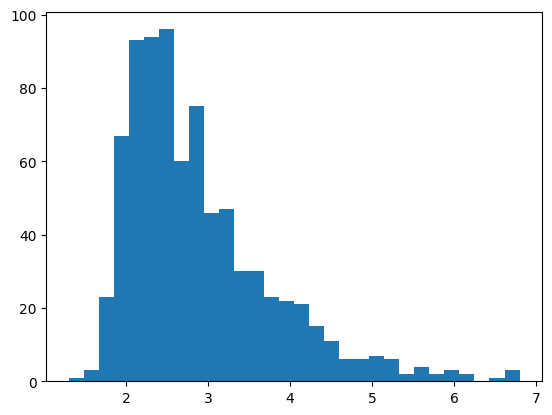

(array([ 1.,  0.,  0.,  0.,  6., 10., 26., 38., 60., 66., 74., 65., 58.,
        58., 53., 53., 37., 37., 27., 25., 28., 22., 14.,  8., 10.,  7.,
         5.,  5.,  3.,  3.]),
 array([0.26236426, 0.31751621, 0.37266815, 0.4278201 , 0.48297204,
        0.53812399, 0.59327593, 0.64842788, 0.70357982, 0.75873177,
        0.81388371, 0.86903566, 0.9241876 , 0.97933955, 1.03449149,
        1.08964344, 1.14479538, 1.19994733, 1.25509927, 1.31025122,
        1.36540316, 1.42055511, 1.47570705, 1.530859  , 1.58601094,
        1.64116289, 1.69631483, 1.75146678, 1.80661872, 1.86177067,
        1.91692261]),
 <BarContainer object of 30 artists>)

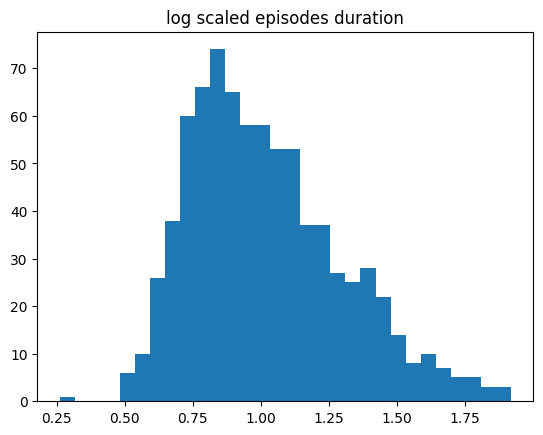

In [31]:
plt.hist(episode_table["max_of_timestamp"],bins = 30)
plt.show()
plt.title('log scaled episodes duration')
plt.hist(np.log(episode_table["max_of_timestamp"]),bins = 30)

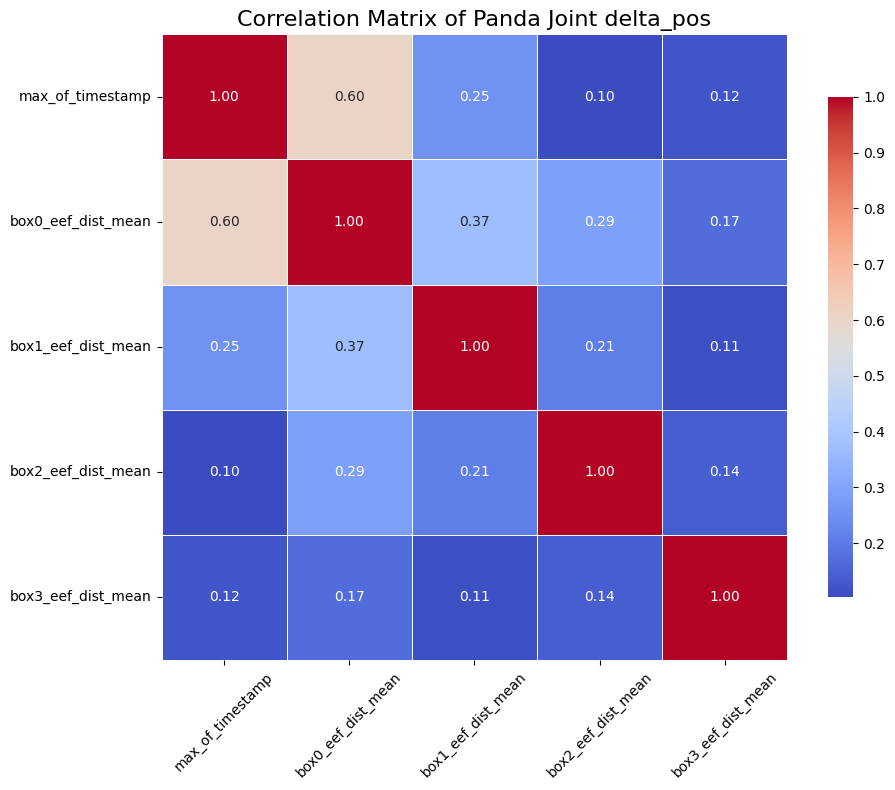

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only the delta_pos columns
delta_pos_cols = ['max_of_timestamp'] + [f'box{i}_eef_dist_mean' for i in range(0, 4)]
delta_pos_data = episode_table[delta_pos_cols]

# Compute the correlation matrix
corr_matrix = delta_pos_data.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,      # Show correlation values
    fmt=".2f",       # Format numbers to 2 decimal places
    cmap='coolwarm', # Color map
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)

plt.title('Correlation Matrix of Panda Joint delta_pos', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

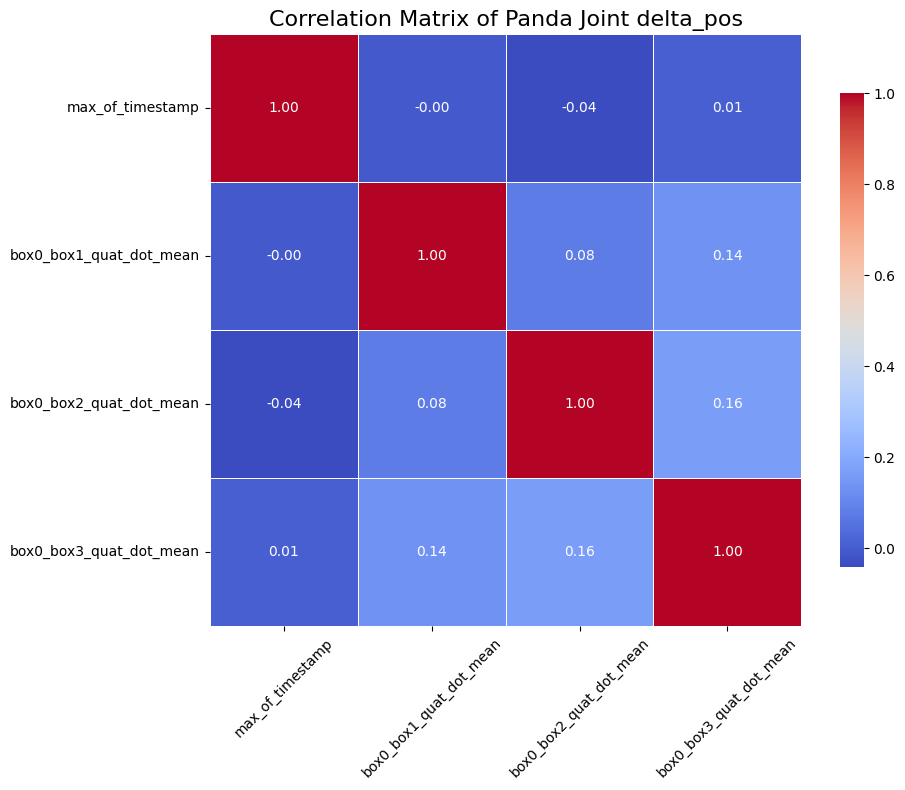

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only the delta_pos columns
delta_pos_cols = ['max_of_timestamp'] + [f'box0_box{i}_quat_dot_mean' for i in range(1, 4)]
delta_pos_data = episode_table[delta_pos_cols]

# Compute the correlation matrix
corr_matrix = delta_pos_data.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,      # Show correlation values
    fmt=".2f",       # Format numbers to 2 decimal places
    cmap='coolwarm', # Color map
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)

plt.title('Correlation Matrix of Panda Joint delta_pos', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

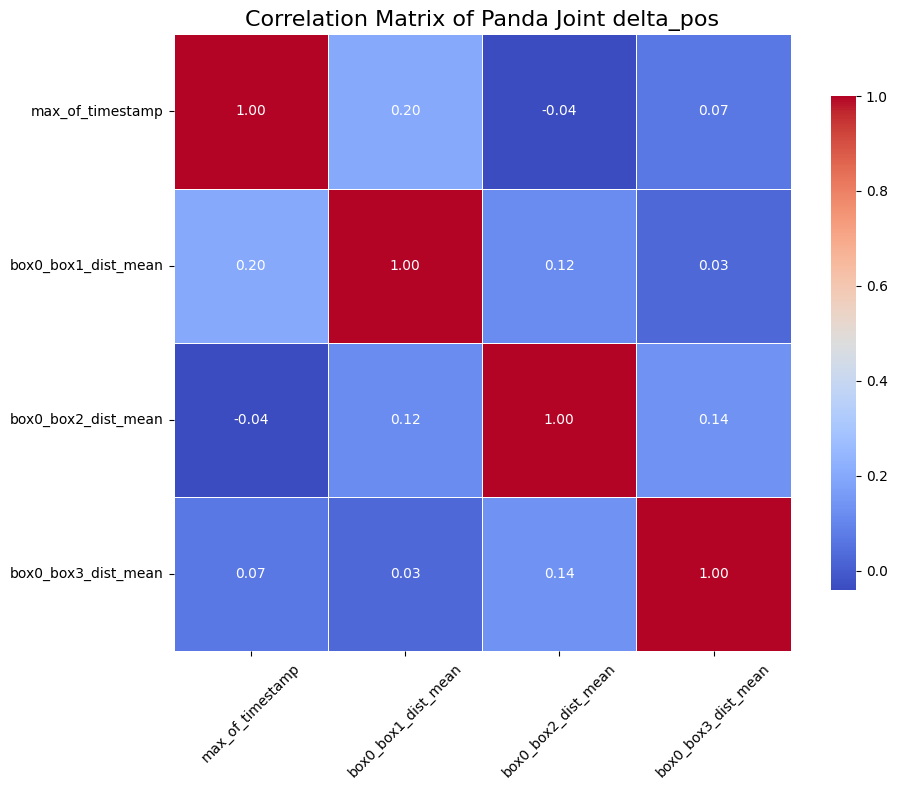

In [34]:

import seaborn as sns
import matplotlib.pyplot as plt

# Select only the delta_pos columns
delta_pos_cols = ['max_of_timestamp'] + [f'box0_box{i}_dist_mean' for i in range(1, 4)]
delta_pos_data = episode_table[delta_pos_cols]

# Compute the correlation matrix
corr_matrix = delta_pos_data.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,      # Show correlation values
    fmt=".2f",       # Format numbers to 2 decimal places
    cmap='coolwarm', # Color map
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)

plt.title('Correlation Matrix of Panda Joint delta_pos', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [35]:
corr_threshold = 0.9
# Drop correlated features
feature_cols = [col for col in episode_table.columns if col != "episode_index"]
corr_matrix = episode_table[feature_cols].corr().abs()

# Select upper triangle of correlation matrix
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than threshold
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > corr_threshold)]

# Drop from episode table
episode_table = episode_table.drop(columns=to_drop)

print(f"Removed {len(to_drop)} highly correlated features:")
print(sorted(to_drop))

Removed 41 highly correlated features:
['box0_box1_dist_max', 'box0_box1_dist_min', 'box0_box1_quat_dot_max', 'box0_box1_quat_dot_min', 'box0_box2_dist_max', 'box0_box2_dist_min', 'box0_box2_quat_dot_max', 'box0_box2_quat_dot_min', 'box0_box3_dist_max', 'box0_box3_quat_dot_max', 'box0_box3_quat_dot_min', 'box0_eef_dist_min', 'box1_box2_dist_max', 'box1_box2_dist_min', 'box1_box2_quat_dot_max', 'box1_box2_quat_dot_min', 'box1_box3_dist_max', 'box1_box3_quat_dot_max', 'box1_box3_quat_dot_min', 'box1_eef_dist_min', 'box2_box3_dist_max', 'box2_box3_quat_dot_max', 'box2_box3_quat_dot_min', 'box2_eef_dist_min', 'gripper_action_changes_count', 'joint2_total_displacement', 'joint3_total_displacement', 'joint4_total_displacement', 'joint5_total_displacement', 'joint6_total_displacement', 'joint7_total_displacement', 'max_eef_displacement', 'max_eef_velocity', 'mean_eef_displacement', 'mean_eef_velocity', 'norm_eef_displacement', 'std_eef_displacement', 'std_eef_velocity', 'sum_eef_displacement'

In [36]:
def find_highly_correlated_features(df, threshold=0.9):
    """
    Identify pairs of features with correlation above a given threshold.

    Parameters:
    -----------
    df : pd.DataFrame
        DataFrame containing only numerical features.
    threshold : float
        Minimum absolute correlation to be considered high.

    Returns:
    --------
    List of tuples: [(feature1, feature2, correlation), ...]
    """
    # Compute correlation matrix
    corr_matrix = df.corr().abs()

    # Create boolean mask for upper triangle
    upper = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)

    # Apply mask
    upper_corr = corr_matrix.where(upper)

    # Extract highly correlated pairs
    high_corr = [
        (col1, col2, upper_corr.loc[col1, col2])
        for col1 in upper_corr.columns
        for col2 in upper_corr.columns
        if col1 != col2 and upper_corr.loc[col1, col2] > threshold
    ]

    # Sort by correlation value
    return sorted(high_corr, key=lambda x: -x[2])

# Example usage:
# Assume X is your features dataframe (exclude target column)
high_corr_features = find_highly_correlated_features(episode_table, threshold=0.9)
for f1, f2, corr in high_corr_features:
    print(f"{f1} and {f2} have correlation {corr:.3f}")


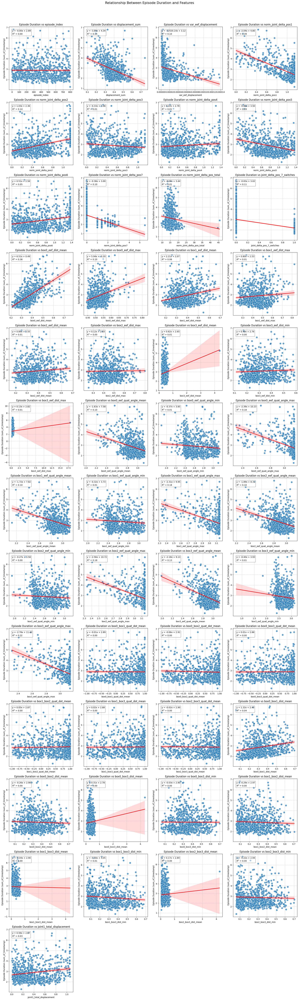

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# Define the target variable (episode duration)
target_col = 'max_of_timestamp'

# Get all numeric feature columns except the target
feature_cols = [col for col in episode_table.columns if col != target_col and episode_table[col].dtype in ['float64', 'int64']]

# Set up the figure with subplots
num_features = len(feature_cols)
num_rows = (num_features // 4) + (1 if num_features % 4 != 0 else 0)  # Determine rows dynamically
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))
axes = axes.flatten()  # Flatten axes for easy indexing

# Create scatter plot for each feature vs episode duration
for i, feature_col in enumerate(feature_cols):
    x = episode_table[feature_col]
    y = episode_table[target_col]

    # Calculate regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    equation = f"y = {slope:.2f}x + {intercept:.2f}"
    r_squared = f"$R^2$ = {r_value**2:.2f}"

    # Plot on the appropriate subplot
    ax = axes[i]
    sns.scatterplot(x=x, y=y, s=80, alpha=0.7, ax=ax)
    sns.regplot(x=x, y=y, scatter=False, color='red', ax=ax)

    # Add title and labels
    ax.set_title(f'Episode Duration vs {feature_col}', fontsize=12)
    ax.set_ylabel('Episode Duration (sum_of_timestamp)', fontsize=10)
    ax.set_xlabel(f'{feature_col}', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.7)

    # Add annotation with equation and R^2
    ax.text(0.05, 0.95, f"{equation}\n{r_squared}",
            transform=ax.transAxes,
            fontsize=10,
            verticalalignment='top',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.5))

# Remove unused subplots if there are extra
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout and add main title
plt.tight_layout()
fig.suptitle('Relationship Between Episode Duration and Features', fontsize=16, y=1.02)

plt.show()


In [38]:
episode_table.describe()

,episode_index,max_of_timestamp,displacement_sum,var_eef_displacement,norm_joint_delta_pos1,norm_joint_delta_pos2,norm_joint_delta_pos3,norm_joint_delta_pos4,norm_joint_delta_pos5,norm_joint_delta_pos6,...,box0_box1_dist_mean,box0_box2_dist_mean,box0_box3_dist_mean,box0_box3_dist_min,box1_box2_dist_mean,box1_box3_dist_mean,box1_box3_dist_min,box2_box3_dist_mean,box2_box3_dist_min,joint1_total_displacement
count,799.000000,799.000000,799.000000,7.990000e+02,799.000000,799.000000,799.000000,799.000000,799.000000,799.000000,...,799.000000,799.000000,799.000000,799.000000,799.000000,799.000000,799.000000,799.000000,799.000000,799.000000
mean,399.000000,2.886984,0.373676,1.862464e-05,0.938215,0.511924,0.523480,0.506055,0.761641,0.645128,...,0.329532,0.337787,0.346878,0.341200,0.276035,0.280344,0.275196,0.268353,0.263213,0.387453
std,230.795725,0.892833,0.086346,2.273825e-05,0.274072,0.324340,0.306938,0.366133,0.332418,0.413255,...,0.135955,0.135052,0.192773,0.131590,0.150321,0.212750,0.156735,0.206099,0.150753,0.280415
min,0.000000,1.300000,0.091966,7.974574e-07,0.003379,0.000594,0.001017,0.001111,0.002793,0.000691,...,0.054691,0.065727,0.060147,0.060060,0.051985,0.056328,0.056328,0.058171,0.058171,0.002281
25%,199.500000,2.233333,0.326268,5.025097e-06,0.860626,0.257047,0.255468,0.216914,0.523494,0.300135,...,0.234126,0.244054,0.249403,0.248604,0.139216,0.128105,0.128105,0.124114,0.124114,0.159183
50%,399.000000,2.633333,0.364381,9.566925e-06,1.064541,0.472867,0.521697,0.431599,0.775025,0.587838,...,0.309638,0.318688,0.327365,0.326240,0.261329,0.268284,0.268123,0.256055,0.255574,0.324974
75%,598.500000,3.266667,0.429763,2.187649e-05,1.120200,0.698736,0.774093,0.713751,1.033226,0.983844,...,0.419104,0.431467,0.432108,0.430850,0.386097,0.381446,0.379800,0.366407,0.365077,0.580531
max,798.000000,6.800000,0.742926,1.378887e-04,1.138880,1.138874,1.138843,1.366678,1.366636,1.366715,...,0.694276,0.716518,4.332782,0.698786,0.705457,4.342128,0.692333,4.236870,0.702689,1.059908


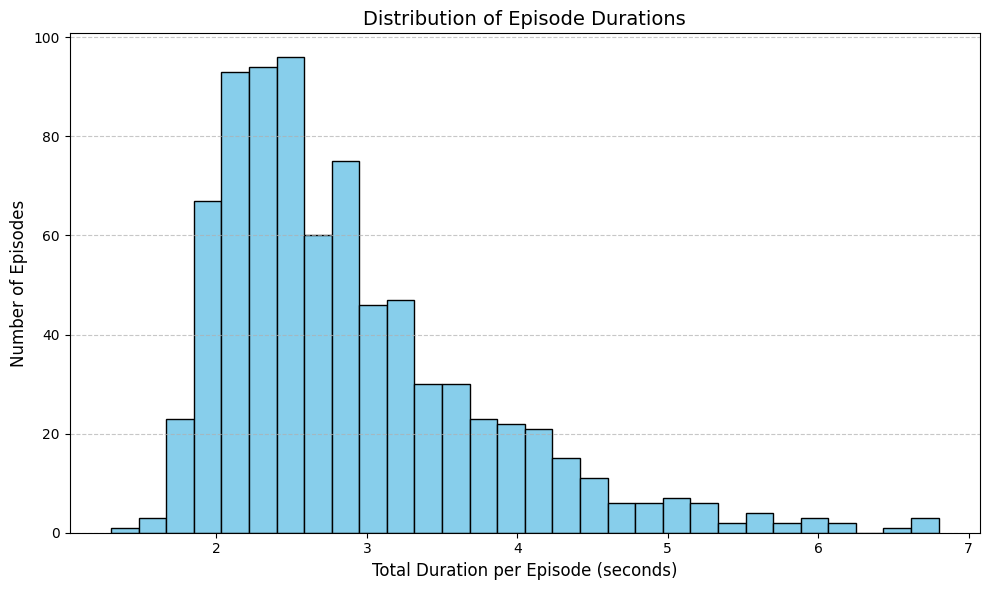

In [39]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(episode_table["max_of_timestamp"], bins=30, color='skyblue', edgecolor='black')
plt.title("Distribution of Episode Durations", fontsize=14)
plt.xlabel("Total Duration per Episode (seconds)", fontsize=12)
plt.ylabel("Number of Episodes", fontsize=12)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


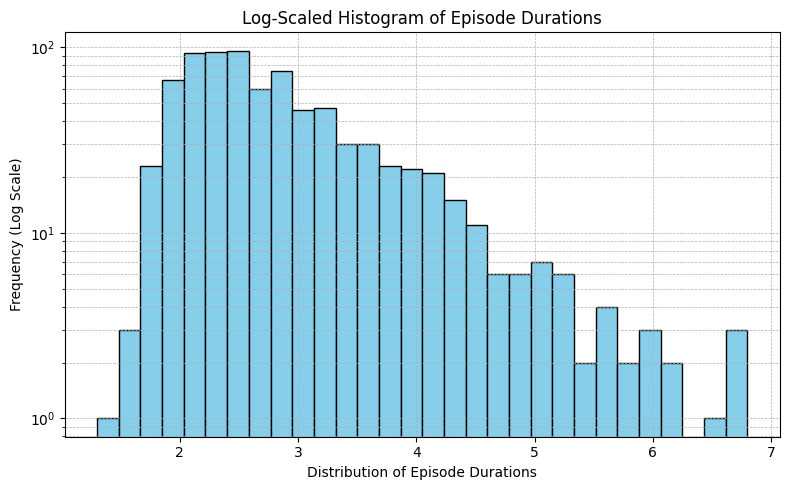

In [40]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.hist(episode_table["max_of_timestamp"], bins=30, color='skyblue', edgecolor='black')
plt.yscale('log')  # Set y-axis to log scale
plt.xlabel("Distribution of Episode Durations")
plt.ylabel("Frequency (Log Scale)")
plt.title("Log-Scaled Histogram of Episode Durations")
plt.grid(True, which="both", linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


# Modeling

In [41]:
# based on analysis above
columns_to_drop = ['episode_index', 'box0_box1_quat_dot_mean',
       'box0_box1_quat_dot_min', 'box0_box1_quat_dot_max',
       'box0_box2_quat_dot_mean', 'box0_box2_quat_dot_min',
       'box0_box2_quat_dot_max', 'box0_box3_quat_dot_mean',
       'box0_box3_quat_dot_min', 'box0_box3_quat_dot_max',
       'box1_box2_quat_dot_mean', 'box1_box2_quat_dot_min',
       'box1_box2_quat_dot_max', 'box1_box3_quat_dot_mean',
       'box1_box3_quat_dot_min', 'box1_box3_quat_dot_max',
       'box2_box3_quat_dot_mean', 'box2_box3_quat_dot_min',
       'box2_box3_quat_dot_max', 'norm_joint_delta_pos7']

## normalization

In [42]:
episode_table['logged_max_of_timestamp'] = np.log(episode_table['max_of_timestamp'])

In [43]:
episode_table.columns

Index(['episode_index', 'max_of_timestamp', 'displacement_sum',
       'var_eef_displacement', 'norm_joint_delta_pos1',
       'norm_joint_delta_pos2', 'norm_joint_delta_pos3',
       'norm_joint_delta_pos4', 'norm_joint_delta_pos5',
       'norm_joint_delta_pos6', 'norm_joint_delta_pos7',
       'norm_joint_delta_pos_total', 'joint_delta_pos_7_switches',
       'box0_eef_dist_mean', 'box0_eef_dist_max', 'box1_eef_dist_mean',
       'box1_eef_dist_max', 'box2_eef_dist_mean', 'box2_eef_dist_max',
       'box3_eef_dist_mean', 'box3_eef_dist_min', 'box3_eef_dist_max',
       'box0_eef_quat_angle_mean', 'box0_eef_quat_angle_min',
       'box0_eef_quat_angle_max', 'box1_eef_quat_angle_mean',
       'box1_eef_quat_angle_min', 'box1_eef_quat_angle_max',
       'box2_eef_quat_angle_mean', 'box2_eef_quat_angle_min',
       'box2_eef_quat_angle_max', 'box3_eef_quat_angle_mean',
       'box3_eef_quat_angle_min', 'box3_eef_quat_angle_max',
       'box0_box1_quat_dot_mean', 'box0_box2_quat_dot_mean

In [44]:
df = episode_table.copy()

# Drop non-feature columns if necessary
columns_to_drop = [col for col in columns_to_drop if col in df.columns]
df = df.drop(columns=columns_to_drop)  # Drop if not needed for modeling

excluded_column = ['max_of_timestamp', 'logged_max_of_timestamp']

# Create a copy of the DataFrame to store normalized data
episode_table_normalized = episode_table.copy()

# List of columns to normalize (excluding the specific column)
columns_to_normalize = [col for col in df.columns if col not in excluded_column]

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform only the columns to normalize
episode_table_normalized[columns_to_normalize] = scaler.fit_transform(df[columns_to_normalize])

In [45]:
df = episode_table_normalized.copy()

# Drop non-feature columns if necessary
df = df.drop(columns=columns_to_drop)  # Drop if not needed for modeling

# Define target and predictors
y = df["logged_max_of_timestamp"]
# y = df["max_of_timestamp"]
X = df.drop(columns=excluded_column)

In [46]:
X.shape

(799, 41)

In [47]:
# also drop zero corr columns

import numpy as np
import pandas as pd

# Compute Pearson correlation for each feature with target
correlations = X.apply(lambda col: np.corrcoef(col, y.squeeze())[0, 1])

# Replace NaNs with 0 (in case of constant columns)
correlations = correlations.fillna(0)

# Define threshold: here strictly zero correlation
mask = np.abs(correlations) > 0.05

# Select only features with non-zero correlation
X_filtered = X.loc[:, mask]

# Optional: print removed columns
removed = X.columns[~mask]
print("Removed features with zero correlation:", list(removed))


Removed features with zero correlation: ['box2_eef_dist_max', 'box0_box2_dist_mean', 'box0_box3_dist_min', 'box1_box3_dist_mean', 'box2_box3_dist_mean', 'box2_box3_dist_min']


In [48]:
X = X_filtered

In [49]:
X.shape

(799, 35)

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Forward Stepwise Regression

In [51]:
import statsmodels.api as sm
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

def cross_val_mse(model_func, X, y, predictors, n_splits=5, random_state=42):
    """
    Computes the average cross-validation MSE for a given set of predictors.
    """
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    mse_list = []

    for train_idx, val_idx in kf.split(X):
        X_train_cv, X_val_cv = X.iloc[train_idx], X.iloc[val_idx]
        y_train_cv, y_val_cv = y.iloc[train_idx], y.iloc[val_idx]

        # Fit model
        X_train_const = sm.add_constant(X_train_cv[predictors])
        model = sm.OLS(y_train_cv, X_train_const).fit()

        # Predict on validation fold
        X_val_const = sm.add_constant(X_val_cv[predictors], has_constant='add')
        y_pred = model.predict(X_val_const)

        mse = mean_squared_error(y_val_cv, y_pred)
        mse_list.append(mse)

    return np.mean(mse_list)

In [52]:
def forward_stepwise_selection_cv(X, y, verbose=True, n_splits=5):
    predictors = []
    remaining = set(X.columns)
    best_models = []

    for k in range(len(X.columns)):
        best_mse = np.inf
        best_model = None
        best_predictor = None

        for predictor in remaining:
            trial_predictors = predictors + [predictor]
            # Compute cross-validation MSE
            mse = cross_val_mse(sm.OLS, X, y, trial_predictors, n_splits=n_splits)

            if mse < best_mse:
                best_mse = mse
                # Train the final model with all data for the selected predictors
                X_full = sm.add_constant(X[trial_predictors])
                model = sm.OLS(y, X_full).fit()
                best_model = model
                best_predictor = predictor

        if best_models and best_mse > best_models[-1][2] * 3:
          print(f"Stop because the error is raising too much")
          break

        if best_predictor is not None:
            predictors.append(best_predictor)
            remaining.remove(best_predictor)
            best_models.append((best_model, predictors.copy(), best_mse))

            if verbose:
                print(f"Step {k+1}: Add '{best_predictor}' | Cross-Validated MSE = {best_mse:.4f}")

    return best_models

In [53]:
# Usage:
best_models = forward_stepwise_selection_cv(X_train, y_train, n_splits=5)

#Select the model with the lowest CV MSE
final_model, final_features, final_mse = min(best_models, key=lambda x: x[2])

print("\n✅ Final Model Features Based on Cross-Validated MSE:")
print(final_features)
print(f"Final CV MSE: {final_mse:.4f}")
final_model.summary()

Step 1: Add 'box0_eef_dist_mean' | Cross-Validated MSE = 0.0481
Step 2: Add 'norm_joint_delta_pos1' | Cross-Validated MSE = 0.0395
Step 3: Add 'box0_box1_dist_mean' | Cross-Validated MSE = 0.0369
Step 4: Add 'displacement_sum' | Cross-Validated MSE = 0.0351
Step 5: Add 'norm_joint_delta_pos4' | Cross-Validated MSE = 0.0333
Step 6: Add 'joint_delta_pos_7_switches' | Cross-Validated MSE = 0.0327
Step 7: Add 'box1_eef_dist_max' | Cross-Validated MSE = 0.0323
Step 8: Add 'box1_eef_dist_mean' | Cross-Validated MSE = 0.0319
Step 9: Add 'box1_eef_quat_angle_mean' | Cross-Validated MSE = 0.0316
Step 10: Add 'box1_eef_quat_angle_min' | Cross-Validated MSE = 0.0314
Step 11: Add 'box1_eef_quat_angle_max' | Cross-Validated MSE = 0.0311
Step 12: Add 'box3_eef_dist_min' | Cross-Validated MSE = 0.0311
Step 13: Add 'box0_box3_dist_mean' | Cross-Validated MSE = 0.0309
Step 14: Add 'var_eef_displacement' | Cross-Validated MSE = 0.0308
Step 15: Add 'norm_joint_delta_pos6' | Cross-Validated MSE = 0.0308
S

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     logged_max_of_timestamp   R-squared:                       0.633
Model:                                 OLS   Adj. R-squared:                  0.624
Method:                      Least Squares   F-statistic:                     71.58
Date:                     Wed, 25 Jun 2025   Prob (F-statistic):          1.38e-124
Time:                             14:04:13   Log-Likelihood:                 226.85
No. Observations:                      639   AIC:                            -421.7
Df Residuals:                          623   BIC:                            -350.3
Df Model:                               15                                         
Covariance Type:                 nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          1.0184      0.007    149.293      0.000       1.005       1.032
box0_eef_dist_mean             0.1146      0.012      9.586      0.000       0.091       0.138
norm_joint_delta_pos1         -0.1023      0.011     -9.709      0.000      -0.123      -0.082
box0_box1_dist_mean            0.0405      0.009      4.308      0.000       0.022       0.059
displacement_sum              -0.0477      0.010     -4.705      0.000      -0.068      -0.028
norm_joint_delta_pos4          0.0538      0.008      6.843      0.000       0.038       0.069
joint_delta_pos_7_switches    -0.0360      0.010     -3.661      0.000      -0.055      -0.017
box1_eef_dist_max             -0.0848      0.018     -4.813      0.000      -0.119      -0.050
box1_eef_dist_mean             0.0788      0.021      3.797      0.000       0.038       0.120
box1_eef_quat_angle_mean       0.1155      0.031      3.683      0.000       0.054       0.177
box1_eef_quat_angle_min       -0.0604      0.020     -3.085      0.002      -0.099      -0.022
box1_eef_quat_angle_max       -0.0456      0.020     -2.259      0.024      -0.085      -0.006
box3_eef_dist_min             -0.0175      0.008     -2.246      0.025      -0.033      -0.002
box0_box3_dist_mean            0.0229      0.007      3.249      0.001       0.009       0.037
var_eef_displacement           0.0191      0.012      1.632      0.103      -0.004       0.042
norm_joint_delta_pos6         -0.0150      0.008     -1.920      0.055      -0.030       0.000
==============================================================================
Omnibus:                       77.790   Durbin-Watson:                   2.121
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              150.255
Skew:                           0.727   Prob(JB):                     2.36e-33
Kurtosis:                       4.878   Cond. No.                         12.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

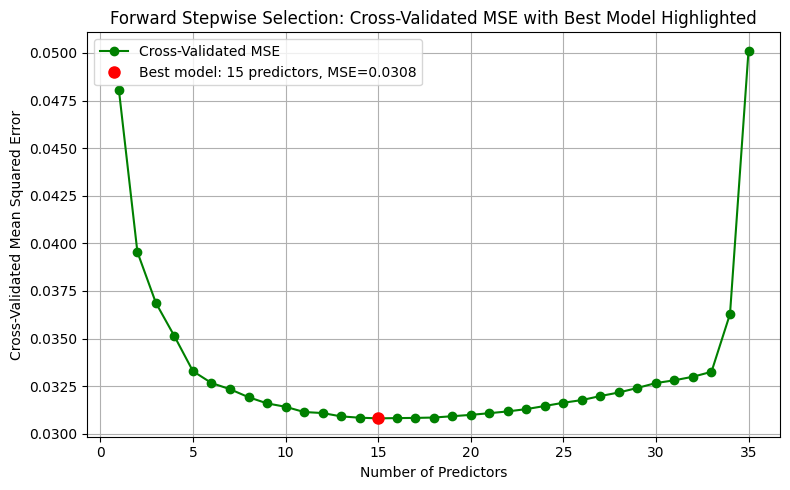

In [54]:
# Visualize the results
# Extract MSE values and number of predictors
mse_values = [m[2] for m in best_models]
num_predictors = [len(m[1]) for m in best_models]

# # Plot Test MSE vs. Number of Predictors
# plt.figure(figsize=(8, 5))
# plt.plot(num_predictors, mse_values, 'go-', label="Cross-Validated MSE")
# plt.xlabel("Number of Predictors")
# plt.ylabel("Cross-Validated Mean Squared Error")
# plt.title("Forward Stepwise Selection: Cross-Validated MSE")
# plt.grid(True)
# plt.tight_layout()
# plt.show()

# Plot with best model highlighted
best_idx = mse_values.index(min(mse_values))
best_num_predictors = num_predictors[best_idx]
best_mse = mse_values[best_idx]

plt.figure(figsize=(8, 5))
plt.plot(num_predictors, mse_values, 'go-', label="Cross-Validated MSE")
plt.plot(best_num_predictors, best_mse, 'ro', markersize=8,
         label=f"Best model: {best_num_predictors} predictors, MSE={best_mse:.4f}")
plt.xlabel("Number of Predictors")
plt.ylabel("Cross-Validated Mean Squared Error")
plt.title("Forward Stepwise Selection: Cross-Validated MSE with Best Model Highlighted")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [55]:
final_r_squared = final_model.rsquared
print(f"The R_squared of the model is: {final_r_squared:.4f}")

The R_squared of the model is: 0.6328


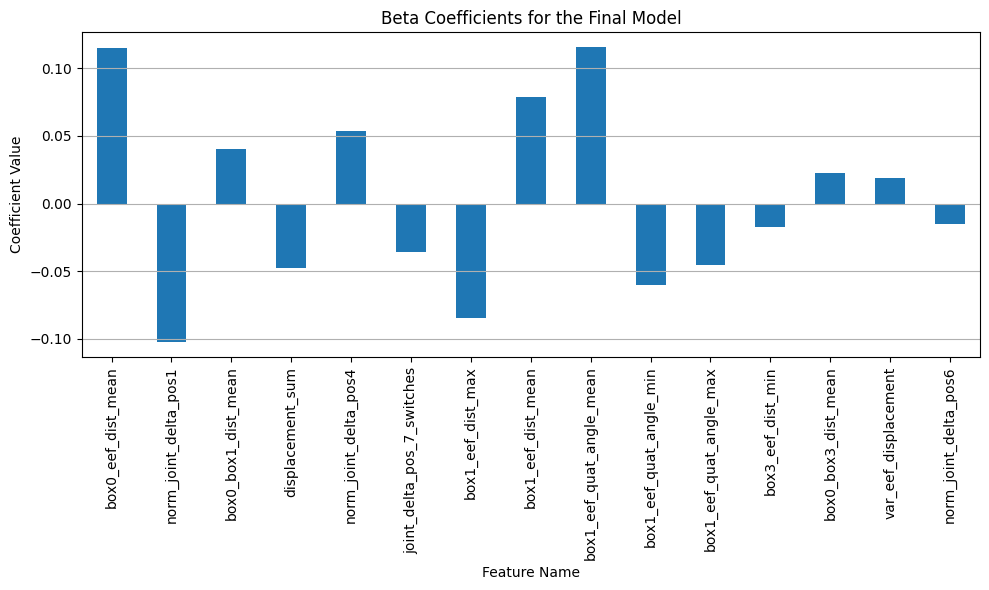

In [56]:
# Column Plot of Beta Coefficients for the Final Model
final_betas = final_model.params.drop('const', errors='ignore') # Drop the intercept
if not final_betas.empty:
    plt.figure(figsize=(10, 6))
    final_betas.plot(kind='bar')
    plt.title("Beta Coefficients for the Final Model")
    plt.xlabel("Feature Name")
    plt.ylabel("Coefficient Value")
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()
else:
    print("\n⚠️ No features selected for the final model, so no beta coefficients to plot.")

In [57]:
print(final_betas)

box0_eef_dist_mean            0.114566
norm_joint_delta_pos1        -0.102314
box0_box1_dist_mean           0.040491
displacement_sum             -0.047748
norm_joint_delta_pos4         0.053807
joint_delta_pos_7_switches   -0.035978
box1_eef_dist_max            -0.084781
box1_eef_dist_mean            0.078771
box1_eef_quat_angle_mean      0.115518
box1_eef_quat_angle_min      -0.060382
box1_eef_quat_angle_max      -0.045601
box3_eef_dist_min            -0.017508
box0_box3_dist_mean           0.022880
var_eef_displacement          0.019143
norm_joint_delta_pos6        -0.014963
dtype: float64


## Lasso Regression

In [58]:
def lasso_cross_validation(X, y, alphas=None, n_folds=5, random_state=42):
    """
    Performs Lasso regression with cross-validation to select the optimal alpha (lambda).

    Args:
        X (pd.DataFrame): Feature matrix.
        y (pd.Series): Target variable.
        alphas (np.ndarray, optional): Array of alpha values to try. If None, LassoCV will use its own.
        n_folds (int): Number of cross-validation folds.
        random_state (int): Random seed for reproducibility.

    Returns:
        tuple: (best_alpha, mse_values, alphas_used, fitted_lasso_cv)
               - best_alpha (float): The optimal alpha value found by cross-validation.
               - mse_values (np.ndarray): Array of mean squared errors for each alpha value.
               - alphas_used (np.ndarray): The actual alpha values used during cross-validation.
               - fitted_lasso_cv (LassoCV): The fitted LassoCV object.
    """

    lasso_cv = LassoCV(alphas=alphas, cv=n_folds, random_state=random_state, n_jobs=-1)
    lasso_cv.fit(X, y)

    return lasso_cv.alpha_, lasso_cv.mse_path_.mean(axis=-1), lasso_cv.alphas_, lasso_cv



✅ Best Alpha (Lambda) found by Cross-Validation: 0.0034489622604057598

✅ MSE Values for different Alphas:
 100.000000    0.078896
93.293040     0.078896
87.035914     0.078896
81.198450     0.078896
75.752503     0.078896
                ...   
0.000132      0.034185
0.000123      0.034262
0.000115      0.034440
0.000107      0.034700
0.000100      0.035023
Length: 200, dtype: float64


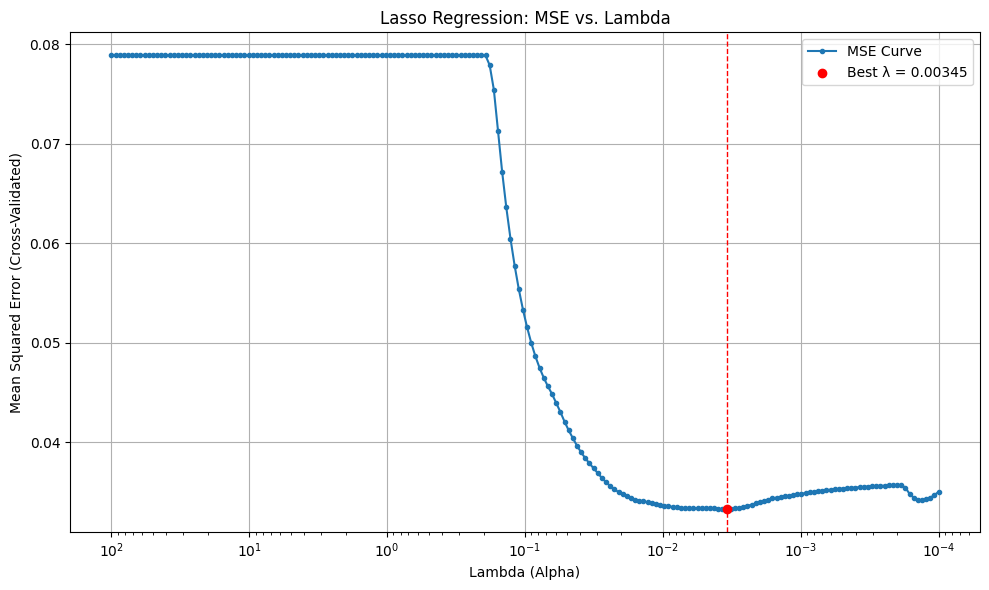

In [59]:
# Usage:
# Assuming X and y are already defined as pandas DataFrame and Series respectively

# Define a range of alpha values to try (optional)
alphas_to_try = np.logspace(-4, 2, 200)

best_alpha, mse_values, alphas_used, lasso_cv_model = lasso_cross_validation(X_train, y_train, alphas=alphas_to_try, n_folds=5, random_state=42)

print("\n✅ Best Alpha (Lambda) found by Cross-Validation:", best_alpha)
print("\n✅ MSE Values for different Alphas:\n", pd.Series(mse_values, index=alphas_used))

# Get the best MSE for plotting
best_mse = np.min(mse_values)

# Plot MSE as a function of Lambda (Alpha)
plt.figure(figsize=(10, 6))
plt.plot(alphas_used, mse_values, marker='.', linestyle='-', label='MSE Curve')
plt.scatter(best_alpha, best_mse, color='red', zorder=5, label=f'Best λ = {best_alpha:.5f}')
plt.axvline(best_alpha, color='red', linestyle='--', linewidth=1)

plt.xscale('log')
plt.xlabel('Lambda (Alpha)')
plt.ylabel('Mean Squared Error (Cross-Validated)')
plt.title('Lasso Regression: MSE vs. Lambda')
plt.grid(True)
plt.gca().invert_xaxis()  # Optional: Invert x-axis to show larger alpha on the left
plt.legend()
plt.tight_layout()
plt.show()

In [60]:
best_coefficients = pd.Series(lasso_cv_model.coef_, index=X.columns)
print("\n✅ Coefficients of the Best Lasso Model:")
print(best_coefficients)


✅ Coefficients of the Best Lasso Model:
displacement_sum             -0.040276
var_eef_displacement          0.001448
norm_joint_delta_pos1        -0.096592
norm_joint_delta_pos2         0.000000
norm_joint_delta_pos3         0.000000
norm_joint_delta_pos4         0.039802
norm_joint_delta_pos5        -0.006109
norm_joint_delta_pos6        -0.012192
norm_joint_delta_pos_total    0.007464
joint_delta_pos_7_switches   -0.032188
box0_eef_dist_mean            0.098972
box0_eef_dist_max             0.000000
box1_eef_dist_mean            0.026966
box1_eef_dist_max            -0.041551
box2_eef_dist_mean           -0.000764
box3_eef_dist_mean           -0.000000
box3_eef_dist_min            -0.004244
box3_eef_dist_max             0.020300
box0_eef_quat_angle_mean      0.002497
box0_eef_quat_angle_min      -0.000000
box0_eef_quat_angle_max       0.007093
box1_eef_quat_angle_mean      0.018742
box1_eef_quat_angle_min      -0.000000
box1_eef_quat_angle_max       0.000000
box2_eef_quat_angle_mea

In [61]:
final_r_squared = lasso_cv_model.score(X_train, y_train)
print(f"The R squared of the model is: {final_r_squared:.4f}")

The R squared of the model is: 0.6265


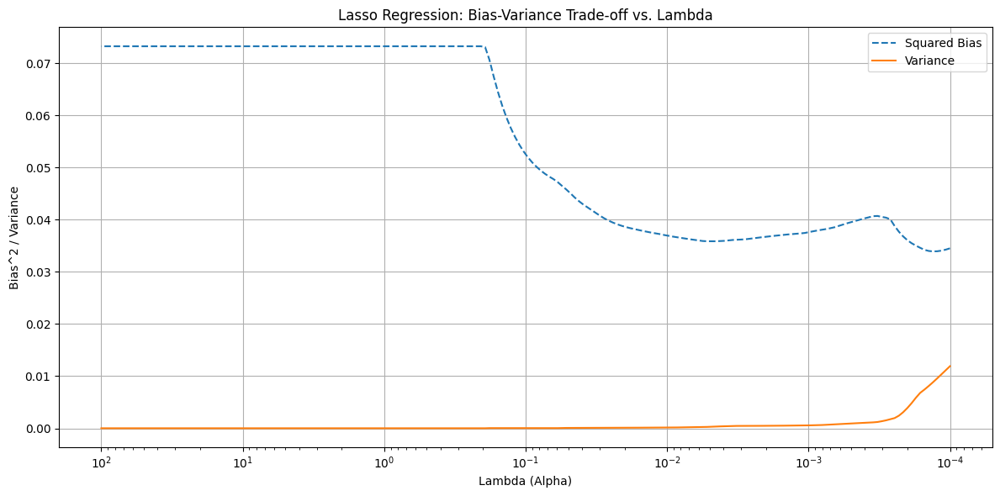

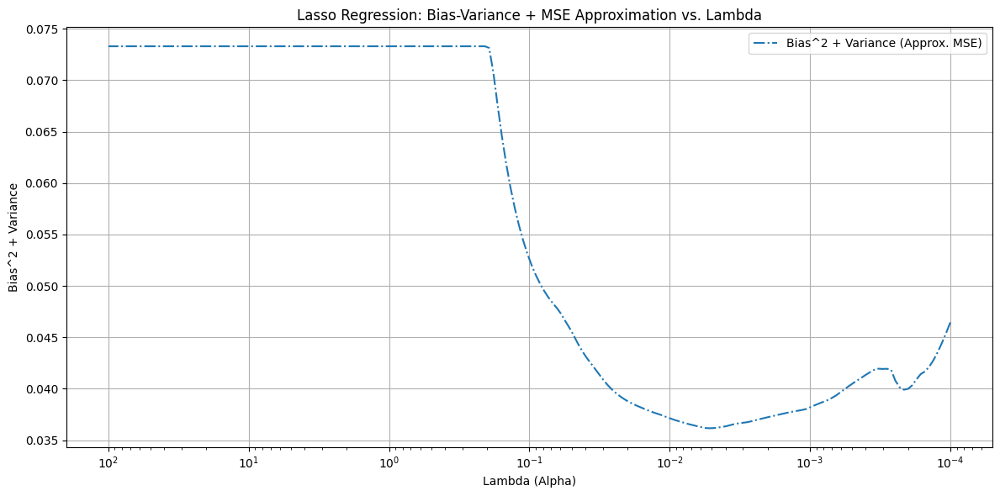

In [62]:
def estimate_bias_variance(X, y, alphas, n_splits=5, random_state=42):
    """
    Estimates the bias and variance for different alpha values in Lasso regression
    using cross-validation.

    Args:ac
        X (pd.DataFrame): Feature matrix.
        y (pd.Series): Target variable.
        alphas (np.ndarray): Array of alpha values to try.
        n_splits (int): Number of cross-validation folds.
        random_state (int): Random seed for reproducibility.

    Returns:
        tuple: (alphas, bias_squared_values, variance_values)
               - alphas (np.ndarray): The alpha values used.
               - bias_squared_values (np.ndarray): Estimated squared bias for each alpha.
               - variance_values (np.ndarray): Estimated variance for each alpha.
    """
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

    bias_squared_values = []
    variance_values = []

    # We'll use a single train-test split to estimate the "true" model performance
    X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, y, test_size=0.3, random_state=random_state)

    for alpha in alphas:
        predictions = []
        models = []
        kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)

        for train_idx, val_idx in kf.split(X_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

            lasso = Lasso(alpha=alpha, random_state=random_state)
            lasso.fit(X_train_fold, y_train_fold)
            models.append(lasso)
            predictions.append(lasso.predict(X_test))

        # Estimate Bias^2 (squared difference between average prediction and true value)
        avg_prediction = np.mean(predictions, axis=0)
        bias_squared = np.mean((avg_prediction - y_test)**2)
        bias_squared_values.append(bias_squared)

        # Estimate Variance (average squared difference of predictions around their mean)
        variance = np.mean(np.var(predictions, axis=0))
        variance_values.append(variance)

    return alphas, np.array(bias_squared_values), np.array(variance_values)

# Usage:
# Assuming X and y are already defined

# Define a range of alpha values to try
alphas_to_try = np.logspace(-4, 2, 200)

# Estimate bias and variance
alphas_plot, bias_sq, variance = estimate_bias_variance(X, y, alphas_to_try, n_splits=5, random_state=42)

# Plot Bias^2 and Variance as a function of Lambda (Alpha)
plt.figure(figsize=(12, 6))
plt.plot(alphas_plot, bias_sq, label='Squared Bias', linestyle='--')
plt.plot(alphas_plot, variance, label='Variance', linestyle='-')
plt.xscale('log')
plt.xlabel('Lambda (Alpha)')
plt.ylabel('Bias^2 / Variance')
plt.title('Lasso Regression: Bias-Variance Trade-off vs. Lambda')
plt.legend()
plt.grid(True)
plt.gca().invert_xaxis() # Optional: Invert x-axis
plt.tight_layout()


# Combine and plot Bias^2 + Variance (approximation of MSE)
plt.figure(figsize=(12, 6))
plt.plot(alphas_plot, bias_sq + variance, label='Bias^2 + Variance (Approx. MSE)', linestyle='-.')
plt.xscale('log')
plt.xlabel('Lambda (Alpha)')
plt.ylabel('Bias^2 + Variance')
plt.title('Lasso Regression: Bias-Variance + MSE Approximation vs. Lambda')
plt.legend()
plt.grid(True)
plt.gca().invert_xaxis() # Optional: Invert x-axis
plt.tight_layout()
plt.show()

## Ridge Regression

In [63]:
from sklearn.linear_model import Ridge



def ridge_cross_validation(X, y, alphas=None, n_folds=5, scoring='neg_mean_squared_error'):
    """
    Performs Ridge regression with cross-validation to select the optimal alpha (lambda).

    Args:
        X (pd.DataFrame): Feature matrix.
        y (pd.Series): Target variable.
        alphas (np.ndarray, optional): Array of alpha values to try.
        n_folds (int): Number of cross-validation folds.
        scoring (str): Scoring metric for cross-validation.

    Returns:
        tuple: (best_alpha, mse_values, alphas_used, fitted_ridge_cv)
               - best_alpha (float): The optimal alpha value found by cross-validation.
               - mse_values (np.ndarray): Mean squared error for each alpha.
               - alphas (np.ndarray): The alpha values tested.
               - fitted_ridge_cv (RidgeCV): The fitted RidgeCV object.
    """

    ridge_cv = RidgeCV(alphas=alphas, cv=n_folds, scoring=scoring)
    ridge_cv.fit(X, y)

    # Note: RidgeCV does not expose MSE path directly; we'll compute manually
    mse_values = []
    kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)
    for alpha in alphas:
        model = sm.OLS if hasattr(sm, 'OLS') else Ridge(alpha=alpha)
        fold_mse = []
        for train_idx, val_idx in kf.split(X):
            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

            ridge = RidgeCV(alphas=[alpha])
            ridge.fit(X_train, y_train)
            y_pred = ridge.predict(X_val)
            fold_mse.append(mean_squared_error(y_val, y_pred))
        mse_values.append(np.mean(fold_mse))

    return ridge_cv.alpha_, np.array(mse_values), alphas, ridge_cv


✅ Best Alpha (Lambda) found by Cross-Validation: 1.350993521198025

✅ MSE Values for different Alphas:
 0.000100      0.050103
0.000107      0.050102
0.000115      0.050101
0.000123      0.050100
0.000132      0.050099
                ...   
75.752503     0.034928
81.198450     0.034952
87.035914     0.034983
93.293040     0.035021
100.000000    0.035066
Length: 200, dtype: float64


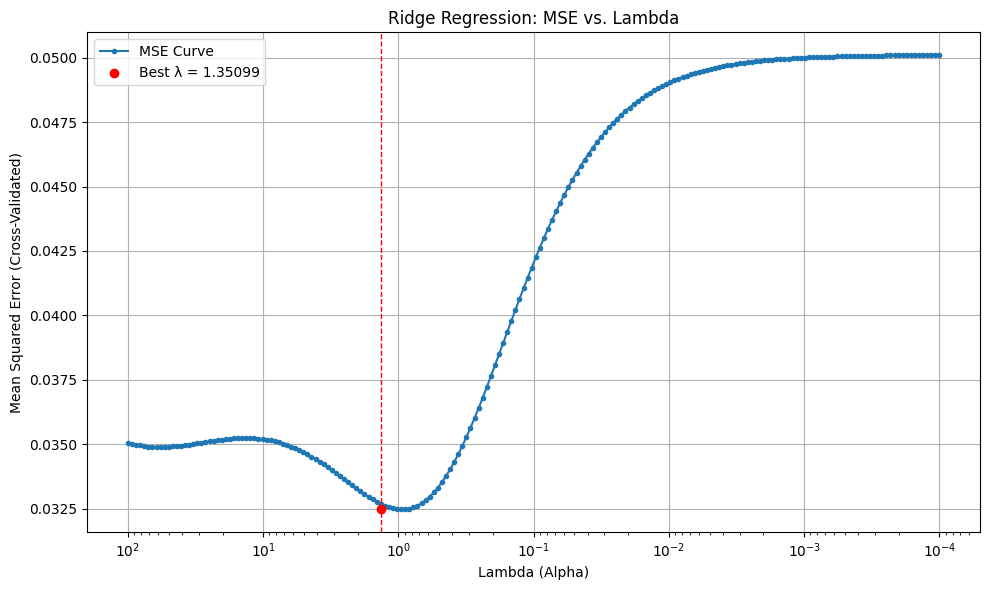

In [64]:
alphas_to_try = np.logspace(-4, 2, 200)

best_alpha, mse_values, alphas_used, ridge_cv_model = ridge_cross_validation(X_train, y_train, alphas=alphas_to_try, n_folds=5)

print("\n✅ Best Alpha (Lambda) found by Cross-Validation:", best_alpha)
print("\n✅ MSE Values for different Alphas:\n", pd.Series(mse_values, index=alphas_used))

# Get the best MSE value for highlighting
best_mse = np.min(mse_values)

# Plot MSE vs. Alpha
plt.figure(figsize=(10, 6))
plt.plot(alphas_used, mse_values, marker='.', linestyle='-', label='MSE Curve')

# Highlight the best alpha
plt.scatter(best_alpha, best_mse, color='red', zorder=5, label=f'Best λ = {best_alpha:.5f}')
plt.axvline(best_alpha, color='red', linestyle='--', linewidth=1)

# Plot formatting
plt.xscale('log')
plt.xlabel('Lambda (Alpha)')
plt.ylabel('Mean Squared Error (Cross-Validated)')
plt.title('Ridge Regression: MSE vs. Lambda')
plt.grid(True)
plt.gca().invert_xaxis()
plt.legend()
plt.tight_layout()
plt.show()


✅ Coefficients of the Best Ridge Model:
displacement_sum             -0.038768
var_eef_displacement          0.014766
norm_joint_delta_pos1        -0.097421
norm_joint_delta_pos2         0.005892
norm_joint_delta_pos3         0.006773
norm_joint_delta_pos4         0.048477
norm_joint_delta_pos5        -0.025442
norm_joint_delta_pos6        -0.024315
norm_joint_delta_pos_total    0.013074
joint_delta_pos_7_switches   -0.034924
box0_eef_dist_mean            0.130530
box0_eef_dist_max            -0.007495
box1_eef_dist_mean            0.068907
box1_eef_dist_max            -0.079948
box2_eef_dist_mean           -0.004815
box3_eef_dist_mean           -0.101696
box3_eef_dist_min             0.037594
box3_eef_dist_max             0.110206
box0_eef_quat_angle_mean      0.038604
box0_eef_quat_angle_min      -0.027287
box0_eef_quat_angle_max       0.004833
box1_eef_quat_angle_mean      0.089189
box1_eef_quat_angle_min      -0.046850
box1_eef_quat_angle_max      -0.031866
box2_eef_quat_angle_mea

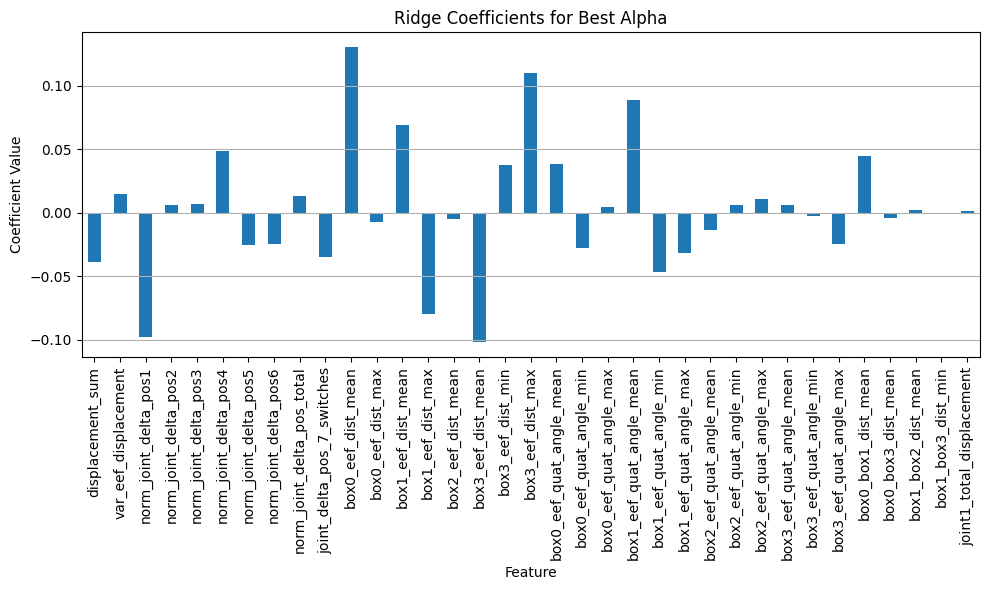

In [65]:
# Best coefficients
best_coefficients = pd.Series(ridge_cv_model.coef_, index=X.columns)
print("\n✅ Coefficients of the Best Ridge Model:")
print(best_coefficients)

# Plot coefficients
plt.figure(figsize=(10, 6))
best_coefficients.plot(kind='bar')
plt.title('Ridge Coefficients for Best Alpha')
plt.xlabel('Feature')
plt.ylabel('Coefficient Value')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [66]:
# Determine the R-squared value of the best Ridge model
final_r_squared = ridge_cv_model.score(X, y)

print(f"The  R-squared of the final model is: {final_r_squared:.4f}")

The  R-squared of the final model is: 0.6244


##Random Forest + Bagging

Dataset shape: (639, 35)
Features: 35, Samples: 639
Training set: 511 samples
Test set: 128 samples
Testing 10 different tree counts: 10 to 190
Target variance: 0.0802
Feature subsampling - Full: 35, Half: 17, Sqrt: 5, Log2: 5

Progress: 1/10 - Testing 10 trees...


/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_bagging.py:1315: UserWarning: Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_forest.py:612: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_forest.py:612: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_forest.py:612: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_forest.py:612: UserWarning: Some inputs do not have OOB scores. This probably means

Iteration completed in 2.73s

Progress: 2/10 - Testing 30 trees...
Iteration completed in 1.67s

Progress: 3/10 - Testing 50 trees...
Iteration completed in 2.40s

Progress: 4/10 - Testing 70 trees...
Iteration completed in 2.18s

Progress: 5/10 - Testing 90 trees...
Iteration completed in 2.80s

Progress: 6/10 - Testing 110 trees...
Iteration completed in 3.39s

Progress: 7/10 - Testing 130 trees...
Iteration completed in 5.32s

Progress: 8/10 - Testing 150 trees...
Iteration completed in 6.64s

Progress: 9/10 - Testing 170 trees...
Iteration completed in 13.56s

Progress: 10/10 - Testing 190 trees...
Iteration completed in 8.50s


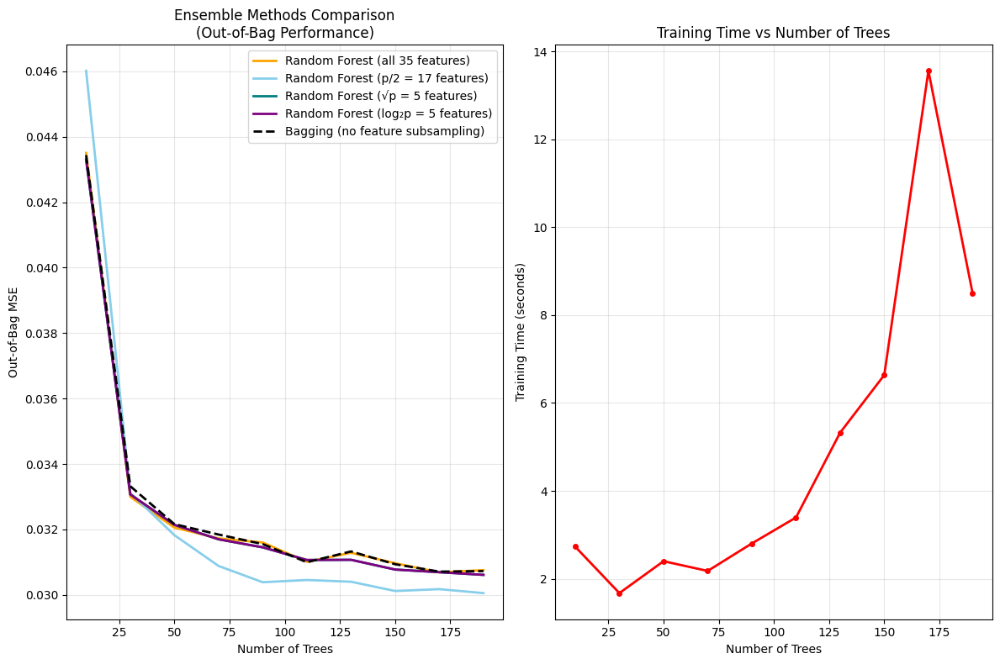


PERFORMANCE SUMMARY
Bagging              | Best: 0.0307 @ 170 trees | Final: 0.0307
RF (all features)    | Best: 0.0307 @ 170 trees | Final: 0.0308
RF (p/2)             | Best: 0.0301 @ 190 trees | Final: 0.0301
RF (√p)              | Best: 0.0306 @ 190 trees | Final: 0.0306
RF (log₂p)           | Best: 0.0306 @ 190 trees | Final: 0.0306
Total training time: 49.20 seconds


In [67]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import time

def compare_ensemble_methods(X, y, max_trees=200, step_size=20, test_size=0.2, random_state=42):
    """
    Compare different ensemble methods using OOB scores.

    Parameters:
    -----------
    X : array-like, shape (n_samples, n_features)
        Feature matrix
    y : array-like, shape (n_samples,)
        Target values
    max_trees : int, default=200
        Maximum number of trees to test
    step_size : int, default=20
        Step size for number of trees
    test_size : float, default=0.2
        Proportion of data to hold out for final validation
    random_state : int, default=42
        Random state for reproducibility

    Returns:
    --------
    dict : Dictionary containing results and fitted models
    """

    print(f"Dataset shape: {X.shape}")
    print(f"Features: {X.shape[1]}, Samples: {X.shape[0]}")

    # Split data - keep larger portion for training to get better OOB estimates
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    print(f"Training set: {X_train.shape[0]} samples")
    print(f"Test set: {X_test.shape[0]} samples")

    # Set range of number of trees (optimized for your dataset size)
    n_trees_list = np.arange(10, max_trees + 1, step_size)
    print(f"Testing {len(n_trees_list)} different tree counts: {n_trees_list[0]} to {n_trees_list[-1]}")

    # Initialize results storage
    results = {
        'n_trees': n_trees_list,
        'oob_mse_bagging': [],
        'oob_mse_rf_full': [],
        'oob_mse_rf_half': [],
        'oob_mse_rf_sqrt': [],
        'oob_mse_rf_log2': [],  # Added log2(p) option
        'training_times': []
    }

    # Calculate variance of y_train for converting OOB R^2 to MSE
    y_train_variance = np.var(y_train)
    print(f"Target variance: {y_train_variance:.4f}")

    # Feature counts for different Random Forest configurations
    n_features = X_train.shape[1]
    features_full = n_features
    features_half = max(1, n_features // 2)
    features_sqrt = max(1, int(np.sqrt(n_features)))
    features_log2 = max(1, int(np.log2(n_features)))

    print(f"Feature subsampling - Full: {features_full}, Half: {features_half}, "
          f"Sqrt: {features_sqrt}, Log2: {features_log2}")

    # Iterate over number of trees
    for i, n_trees in enumerate(n_trees_list):
        print(f"\nProgress: {i+1}/{len(n_trees_list)} - Testing {n_trees} trees...")
        iteration_start = time.time()

        # 1. Bagging (full features, no feature subsampling)
        try:
            bag = BaggingRegressor(
                estimator=DecisionTreeRegressor(max_depth=10, min_samples_split=5),  # Limit depth for speed
                n_estimators=n_trees,
                max_features=1.0,  # Use all features
                bootstrap=True,
                oob_score=True,
                random_state=random_state,
                n_jobs=-1
            )
            bag.fit(X_train, y_train)

            if not np.isnan(bag.oob_score_) and bag.oob_score_ <= 1:
                oob_mse = y_train_variance * (1 - bag.oob_score_)
                results['oob_mse_bagging'].append(oob_mse)
            else:
                results['oob_mse_bagging'].append(np.nan)
        except Exception as e:
            print(f"Bagging failed: {e}")
            results['oob_mse_bagging'].append(np.nan)

        # 2. Random Forest with all features
        try:
            rf_full = RandomForestRegressor(
                n_estimators=n_trees,
                max_features=features_full,
                max_depth=10,  # Limit depth for speed
                min_samples_split=5,
                bootstrap=True,
                oob_score=True,
                random_state=random_state,
                n_jobs=-1
            )
            rf_full.fit(X_train, y_train)

            if not np.isnan(rf_full.oob_score_) and rf_full.oob_score_ <= 1:
                oob_mse = y_train_variance * (1 - rf_full.oob_score_)
                results['oob_mse_rf_full'].append(oob_mse)
            else:
                results['oob_mse_rf_full'].append(np.nan)
        except Exception as e:
            print(f"RF Full failed: {e}")
            results['oob_mse_rf_full'].append(np.nan)

        # 3. Random Forest with half features
        try:
            rf_half = RandomForestRegressor(
                n_estimators=n_trees,
                max_features=features_half,
                max_depth=10,
                min_samples_split=5,
                bootstrap=True,
                oob_score=True,
                random_state=random_state,
                n_jobs=-1
            )
            rf_half.fit(X_train, y_train)

            if not np.isnan(rf_half.oob_score_) and rf_half.oob_score_ <= 1:
                oob_mse = y_train_variance * (1 - rf_half.oob_score_)
                results['oob_mse_rf_half'].append(oob_mse)
            else:
                results['oob_mse_rf_half'].append(np.nan)
        except Exception as e:
            print(f"RF Half failed: {e}")
            results['oob_mse_rf_half'].append(np.nan)

        # 4. Random Forest with sqrt(p) features
        try:
            rf_sqrt = RandomForestRegressor(
                n_estimators=n_trees,
                max_features='sqrt',  # sklearn handles this automatically
                max_depth=10,
                min_samples_split=5,
                bootstrap=True,
                oob_score=True,
                random_state=random_state,
                n_jobs=-1
            )
            rf_sqrt.fit(X_train, y_train)

            if not np.isnan(rf_sqrt.oob_score_) and rf_sqrt.oob_score_ <= 1:
                oob_mse = y_train_variance * (1 - rf_sqrt.oob_score_)
                results['oob_mse_rf_sqrt'].append(oob_mse)
            else:
                results['oob_mse_rf_sqrt'].append(np.nan)
        except Exception as e:
            print(f"RF Sqrt failed: {e}")
            results['oob_mse_rf_sqrt'].append(np.nan)

        # 5. Random Forest with log2(p) features
        try:
            rf_log2 = RandomForestRegressor(
                n_estimators=n_trees,
                max_features='log2',  # sklearn handles this automatically
                max_depth=10,
                min_samples_split=5,
                bootstrap=True,
                oob_score=True,
                random_state=random_state,
                n_jobs=-1
            )
            rf_log2.fit(X_train, y_train)

            if not np.isnan(rf_log2.oob_score_) and rf_log2.oob_score_ <= 1:
                oob_mse = y_train_variance * (1 - rf_log2.oob_score_)
                results['oob_mse_rf_log2'].append(oob_mse)
            else:
                results['oob_mse_rf_log2'].append(np.nan)
        except Exception as e:
            print(f"RF Log2 failed: {e}")
            results['oob_mse_rf_log2'].append(np.nan)


        iteration_time = time.time() - iteration_start
        results['training_times'].append(iteration_time)
        print(f"Iteration completed in {iteration_time:.2f}s")

    # Store test data for final validation if needed
    results['X_test'] = X_test
    results['y_test'] = y_test
    results['X_train'] = X_train
    results['y_train'] = y_train

    return results

def plot_ensemble_comparison(results, figsize=(12, 8)):
    """Plot the ensemble comparison results"""

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    # Main OOB MSE plot
    n_trees_list = results['n_trees']
    n_features = results['X_train'].shape[1]


    ax1.plot(n_trees_list, results['oob_mse_rf_full'],
             label=f"Random Forest (all {n_features} features)",
             color="orange", linewidth=2)
    ax1.plot(n_trees_list, results['oob_mse_rf_half'],
             label=f"Random Forest (p/2 = {max(1, n_features // 2)} features)",
             color="skyblue", linewidth=2)
    ax1.plot(n_trees_list, results['oob_mse_rf_sqrt'],
             label=f"Random Forest (√p = {max(1, int(np.sqrt(n_features)))} features)",
             color="teal", linewidth=2)
    ax1.plot(n_trees_list, results['oob_mse_rf_log2'],
             label=f"Random Forest (log₂p = {max(1, int(np.log2(n_features)))} features)",
             color="purple", linewidth=2)
    ax1.plot(n_trees_list, results['oob_mse_bagging'],
             label="Bagging (no feature subsampling)",
             color="black", linestyle="--", linewidth=2)

    ax1.set_xlabel("Number of Trees")
    ax1.set_ylabel("Out-of-Bag MSE")
    ax1.set_title("Ensemble Methods Comparison\n(Out-of-Bag Performance)")
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Training time plot
    ax2.plot(n_trees_list, results['training_times'],
             color="red", marker='o', linewidth=2, markersize=4)
    ax2.set_xlabel("Number of Trees")
    ax2.set_ylabel("Training Time (seconds)")
    ax2.set_title("Training Time vs Number of Trees")
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Print summary statistics
    print("\n"+"="*60)
    print("PERFORMANCE SUMMARY")
    print("="*60)

    methods = ['Bagging', 'RF (all features)', 'RF (p/2)', 'RF (√p)', 'RF (log₂p)']
    oob_results = [
        results['oob_mse_bagging'],
        results['oob_mse_rf_full'],
        results['oob_mse_rf_half'],
        results['oob_mse_rf_sqrt'],
        results['oob_mse_rf_log2']
    ]

    for method, mse_list in zip(methods, oob_results):
        # Filter out NaN values
        valid_mse = [mse for mse in mse_list if not np.isnan(mse)]
        if valid_mse:
            best_mse = min(valid_mse)
            best_idx = mse_list.index(best_mse)
            best_trees = n_trees_list[best_idx]
            final_mse = valid_mse[-1]
            print(f"{method:<20} | Best: {best_mse:.4f} @ {best_trees} trees | Final: {final_mse:.4f}")
        else:
            print(f"{method:<20} | No valid results")

    print("="*60)
    print(f"Total training time: {sum(results['training_times']):.2f} seconds")

# Example usage:
results = compare_ensemble_methods(X_train, y_train, max_trees=200, step_size=20)
plot_ensemble_comparison(results)

In [68]:
# 2. Train Random Forest with m = sqrt(p), 100 trees, and OOB enabled
rf_sqrt = RandomForestRegressor(
    n_estimators=100,
    max_features='sqrt',     # m = sqrt(p)
    bootstrap=True,
    oob_score=True,
    random_state=42,
    n_jobs=-1
)
rf_sqrt.fit(X_train, y_train)

# 3. Compute OOB R^2 and Test R^2
oob_r2 = rf_sqrt.oob_score_
y_pred_test = rf_sqrt.predict(X_test)
test_r2 = r2_score(y_test, y_pred_test)

# 4. Print results
print(f"✅ OOB R² score:  {oob_r2:.3f}")
print(f"✅ Test R² score: {test_r2:.3f}")


✅ OOB R² score:  0.635
✅ Test R² score: 0.568


## grad boosting and svm

In [69]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 9.6 MB/s eta 0:00:00


Dataset: 639 samples, 35 features
Target range: [0.262, 1.902]

🟠 Training CatBoost...
   Test MSE: 0.0286
   Test R²: 0.5945
   CV MSE: 0.0322 (±0.0058)

🔵 Training SVM...
   Test MSE: 0.0215
   Test R²: 0.6946
   CV MSE: 0.0335 (±0.0079)


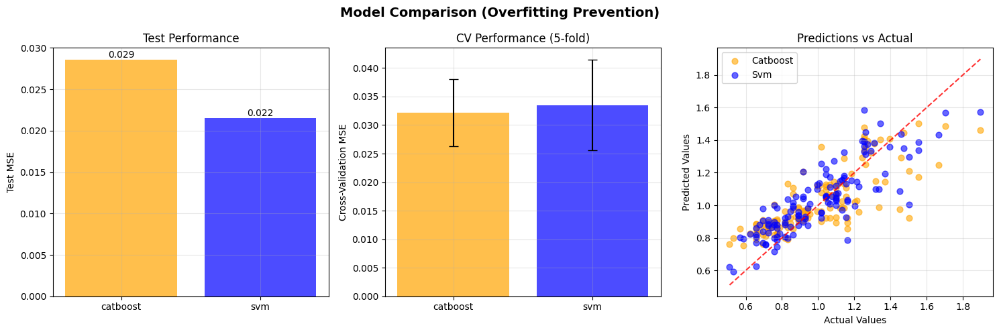


SUMMARY (with overfitting prevention)

CATBOOST:
  Test MSE: 0.0286
  Test R²:  0.5945
  CV MSE:   0.0322 (±0.0058)
  ✅ Good generalization

SVM:
  Test MSE: 0.0215
  Test R²:  0.6946
  CV MSE:   0.0335 (±0.0079)
  ✅ Good generalization

🏆 Best Model: SVM

🔍 OVERFITTING ANALYSIS
------------------------------

CATBOOST:
  CV MSE:    0.0322
  Test MSE:  0.0286
  Gap:       0.0036 (11.2%)
  Status:    ✅ GOOD GENERALIZATION

SVM:
  CV MSE:    0.0335
  Test MSE:  0.0215
  Gap:       0.0120 (35.8%)
  Status:    ⚡ MODERATE OVERFITTING


In [70]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import warnings
warnings.filterwarnings('ignore')

# CatBoost import with error handling
try:
    from catboost import CatBoostRegressor
    CATBOOST_AVAILABLE = True
except ImportError:
    print("CatBoost not installed. Install with: pip install catboost")
    CATBOOST_AVAILABLE = False

def simple_model_comparison(X, y, test_size=0.2, random_state=42):
    """
    Simple comparison of CatBoost and SVM with strong overfitting prevention.

    Parameters:
    -----------
    X : array-like, shape (n_samples, n_features)
        Feature matrix
    y : array-like, shape (n_samples,)
        Target values
    test_size : float, default=0.2
        Proportion of data for testing
    random_state : int, default=42
        Random state for reproducibility

    Returns:
    --------
    dict : Dictionary containing results and fitted models
    """

    print(f"Dataset: {X.shape[0]} samples, {X.shape[1]} features")
    print(f"Target range: [{y.min():.3f}, {y.max():.3f}]")

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    # Scale features for SVM
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    results = {}

    # =================================================================
    # CATBOOST - Conservative parameters to prevent overfitting
    # =================================================================
    if CATBOOST_AVAILABLE:
        print("\n🟠 Training CatBoost...")

        catboost_model = CatBoostRegressor(
            # Conservative settings to prevent overfitting
            iterations=100,              # Fewer iterations
            learning_rate=0.05,          # Lower learning rate
            depth=4,                     # Shallow trees
            l2_leaf_reg=10,              # Strong L2 regularization

            # Overfitting prevention
            early_stopping_rounds=20,    # Stop early if no improvement
            use_best_model=True,         # Use best model from validation
            eval_fraction=0.1,           # Use 10% for internal validation

            # Other settings
            random_state=random_state,
            verbose=False,
            bootstrap_type='Bayesian',   # More robust than default
            bagging_temperature=0.5      # Reduce overfitting in bagging
        )

        # Fit with validation set for early stopping
        catboost_model.fit(X_train, y_train)

        # Predictions and metrics
        y_pred_cat = catboost_model.predict(X_test)
        cat_mse = mean_squared_error(y_test, y_pred_cat)
        cat_r2 = r2_score(y_test, y_pred_cat)

        # Cross-validation for more robust evaluation
        cv_scores_cat = cross_val_score(
            catboost_model, X_train, y_train,
            cv=5, scoring='neg_mean_squared_error'
        )

        results['catboost'] = {
            'model': catboost_model,
            'test_mse': cat_mse,
            'test_r2': cat_r2,
            'cv_mse_mean': -cv_scores_cat.mean(),
            'cv_mse_std': cv_scores_cat.std(),
            'predictions': y_pred_cat
        }

        print(f"   Test MSE: {cat_mse:.4f}")
        print(f"   Test R²: {cat_r2:.4f}")
        print(f"   CV MSE: {-cv_scores_cat.mean():.4f} (±{cv_scores_cat.std():.4f})")

    # =================================================================
    # SVM - Conservative parameters to prevent overfitting
    # =================================================================
    print("\n🔵 Training SVM...")

    svm_model = SVR(
        # Conservative settings to prevent overfitting
        kernel='rbf',
        C=1.0,                    # Moderate regularization (lower C = more regularization)
        gamma='scale',            # Automatic gamma scaling
        epsilon=0.1,              # Tolerance for stopping criterion

        # Additional overfitting prevention
        shrinking=True,           # Use shrinking heuristic
        cache_size=200,           # Memory cache
        max_iter=1000            # Limit iterations
    )

    # Fit the model
    svm_model.fit(X_train_scaled, y_train)

    # Predictions and metrics
    y_pred_svm = svm_model.predict(X_test_scaled)
    svm_mse = mean_squared_error(y_test, y_pred_svm)
    svm_r2 = r2_score(y_test, y_pred_svm)

    # Cross-validation
    cv_scores_svm = cross_val_score(
        svm_model, X_train_scaled, y_train,
        cv=5, scoring='neg_mean_squared_error'
    )

    results['svm'] = {
        'model': svm_model,
        'test_mse': svm_mse,
        'test_r2': svm_r2,
        'cv_mse_mean': -cv_scores_svm.mean(),
        'cv_mse_std': cv_scores_svm.std(),
        'predictions': y_pred_svm
    }

    print(f"   Test MSE: {svm_mse:.4f}")
    print(f"   Test R²: {svm_r2:.4f}")
    print(f"   CV MSE: {-cv_scores_svm.mean():.4f} (±{cv_scores_svm.std():.4f})")

    # Store additional data
    results['test_data'] = {'X_test': X_test, 'y_test': y_test}
    results['scaler'] = scaler

    return results

def plot_simple_comparison(results):
    """Simple visualization of model comparison"""

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle('Model Comparison (Overfitting Prevention)', fontsize=14, fontweight='bold')

    models = [k for k in results.keys() if k not in ['test_data', 'scaler']]
    colors = {'catboost': 'orange', 'svm': 'blue'}

    # 1. Test MSE Comparison
    ax1 = axes[0]
    test_mses = [results[model]['test_mse'] for model in models]
    bars = ax1.bar(models, test_mses, color=[colors[m] for m in models], alpha=0.7)
    ax1.set_ylabel('Test MSE')
    ax1.set_title('Test Performance')
    ax1.grid(True, alpha=0.3)

    # Add values on bars
    for bar, mse in zip(bars, test_mses):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{mse:.3f}', ha='center', va='bottom')

    # 2. Cross-validation comparison with error bars
    ax2 = axes[1]
    cv_means = [results[model]['cv_mse_mean'] for model in models]
    cv_stds = [results[model]['cv_mse_std'] for model in models]

    bars = ax2.bar(models, cv_means, yerr=cv_stds,
                   color=[colors[m] for m in models], alpha=0.7, capsize=5)
    ax2.set_ylabel('Cross-Validation MSE')
    ax2.set_title('CV Performance (5-fold)')
    ax2.grid(True, alpha=0.3)

    # 3. Predictions vs Actual
    ax3 = axes[2]
    y_test = results['test_data']['y_test']

    for model in models:
        y_pred = results[model]['predictions']
        ax3.scatter(y_test, y_pred, alpha=0.6,
                   color=colors[model], label=model.capitalize(), s=40)

    # Perfect prediction line
    min_val = y_test.min()
    max_val = y_test.max()
    ax3.plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8)

    ax3.set_xlabel('Actual Values')
    ax3.set_ylabel('Predicted Values')
    ax3.set_title('Predictions vs Actual')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Print summary
    print("\n" + "="*50)
    print("SUMMARY (with overfitting prevention)")
    print("="*50)

    best_model = None
    best_mse = float('inf')

    for model in models:
        test_mse = results[model]['test_mse']
        cv_mse = results[model]['cv_mse_mean']
        cv_std = results[model]['cv_mse_std']
        r2 = results[model]['test_r2']

        print(f"\n{model.upper()}:")
        print(f"  Test MSE: {test_mse:.4f}")
        print(f"  Test R²:  {r2:.4f}")
        print(f"  CV MSE:   {cv_mse:.4f} (±{cv_std:.4f})")

        # Check for overfitting (large gap between CV and test performance)
        if abs(test_mse - cv_mse) > cv_std * 2:
            print(f"  ⚠️  Potential overfitting detected!")
        else:
            print(f"  ✅ Good generalization")

        if test_mse < best_mse:
            best_mse = test_mse
            best_model = model

    if best_model:
        print(f"\n🏆 Best Model: {best_model.upper()}")

    print("="*50)

def evaluate_overfitting(results):
    """Check for signs of overfitting"""
    print("\n🔍 OVERFITTING ANALYSIS")
    print("-" * 30)

    models = [k for k in results.keys() if k not in ['test_data', 'scaler']]

    for model in models:
        test_mse = results[model]['test_mse']
        cv_mse = results[model]['cv_mse_mean']
        cv_std = results[model]['cv_mse_std']

        # Calculate performance gap
        gap = abs(test_mse - cv_mse)
        gap_ratio = gap / cv_mse

        print(f"\n{model.upper()}:")
        print(f"  CV MSE:    {cv_mse:.4f}")
        print(f"  Test MSE:  {test_mse:.4f}")
        print(f"  Gap:       {gap:.4f} ({gap_ratio*100:.1f}%)")

        if gap > cv_std * 2:
            print(f"  Status:    ⚠️  HIGH OVERFITTING RISK")
        elif gap > cv_std:
            print(f"  Status:    ⚡ MODERATE OVERFITTING")
        else:
            print(f"  Status:    ✅ GOOD GENERALIZATION")

# Simple usage function
def compare_models(X, y, **kwargs):
    """One-line function to compare models with overfitting prevention"""
    results = simple_model_comparison(X, y, **kwargs)
    plot_simple_comparison(results)
    evaluate_overfitting(results)
    return results

# Example usage:
results = compare_models(X_train, y_train)
#
# # Access individual models:
catboost_model = results['catboost']['model']
svm_model = results['svm']['model']

In [71]:
catboost_model = CatBoostRegressor()
summary = catboost_model.select_features(X_train, y_train, features_for_select=X_train.columns, num_features_to_select=15, verbose=False)

Learning rate set to 0.038146
Step #1 out of 1
Feature #18 eliminated
Feature #31 eliminated
Feature #22 eliminated
Feature #25 eliminated
Feature #33 eliminated
Feature #23 eliminated
Feature #21 eliminated
Feature #14 eliminated
Feature #32 eliminated
Feature #11 eliminated
Feature #24 eliminated
Feature #19 eliminated
Feature #15 eliminated
Feature #17 eliminated
Feature #7 eliminated
Feature #20 eliminated
Feature #26 eliminated
Feature #28 eliminated
Feature #34 eliminated
Feature #12 eliminated
Train final model


In [72]:
print('Selected features indices:', summary['selected_features'])
print('Selected features names:', summary['selected_features_names'])
print('Eliminated features indices:', summary['eliminated_features'])
print('Eliminated features names:', summary['eliminated_features_names'])

Selected features indices: [0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 13, 16, 27, 29, 30]
Selected features names: ['displacement_sum', 'var_eef_displacement', 'norm_joint_delta_pos1', 'norm_joint_delta_pos2', 'norm_joint_delta_pos3', 'norm_joint_delta_pos4', 'norm_joint_delta_pos5', 'norm_joint_delta_pos_total', 'joint_delta_pos_7_switches', 'box0_eef_dist_mean', 'box1_eef_dist_max', 'box3_eef_dist_min', 'box3_eef_quat_angle_mean', 'box3_eef_quat_angle_max', 'box0_box1_dist_mean']
Eliminated features indices: [18, 31, 22, 25, 33, 23, 21, 14, 32, 11, 24, 19, 15, 17, 7, 20, 26, 28, 34, 12]
Eliminated features names: ['box0_eef_quat_angle_mean', 'box0_box3_dist_mean', 'box1_eef_quat_angle_min', 'box2_eef_quat_angle_min', 'box1_box3_dist_min', 'box1_eef_quat_angle_max', 'box1_eef_quat_angle_mean', 'box2_eef_dist_mean', 'box1_box2_dist_mean', 'box0_eef_dist_max', 'box2_eef_quat_angle_mean', 'box0_eef_quat_angle_min', 'box3_eef_dist_mean', 'box3_eef_dist_max', 'norm_joint_delta_pos6', 'box0_eef_quat_a

In [73]:
# from catboost import CatBoostRegressor
# from sklearn.model_selection import GridSearchCV

# # Define parameter grid for search
# param_grid = {
#     'depth': [4, 6, 8],
#     'l2_leaf_reg': [1, 3, 5],
#     'random_state': [42]
# }

# # Build CatBoost regressor (important: silent mode!)
# catboost = CatBoostRegressor(verbose=False)

# # Use GridSearchCV for tuning
# grid_search = GridSearchCV(estimator=catboost,
#                            param_grid=param_grid,
#                            scoring='r2',
#                            cv=5,
#                            n_jobs=-1,  # parallelism
#                            verbose=1)

# # Fit only on selected features
# grid_search.fit(X_train[summary['selected_features_names']], y_train)

# # Best parameters found
# print("Best parameters:", grid_search.best_params_)
# print("Best R2 score (CV):", grid_search.best_score_)

# # Use best estimator to predict on test set
# catboost_best = grid_search.best_estimator_
# catboost_preds = catboost_best.predict(X_test[summary['selected_features_names']])
# catboost_r2 = r2_score(y_test, catboost_preds)
# print("Test R2 score:", catboost_r2)


In [74]:
from catboost import CatBoostRegressor


catboost = CatBoostRegressor(verbose=False, depth=4, l2_leaf_reg=20, random_state=42, subsample=0.6, colsample_bylevel=.6)
catboost.fit(X_train[summary['selected_features_names']], y_train)


y_train_cb = catboost.predict(X_train[summary['selected_features_names']])
y_test_cb = catboost.predict(X_test[summary['selected_features_names']])

print(f"train_r2 = {r2_score(y_train, y_train_cb)}, test_r2 = {r2_score(y_test, y_test_cb)}")
print(f"train_mse = {mean_squared_error(y_train, y_train_cb)}, test_mse = {mean_squared_error(y_test, y_test_cb)}")

train_r2 = 0.8727015925742931, test_r2 = 0.6101033611293456
train_mse = 0.0099797707076695, test_mse = 0.02896881501506291


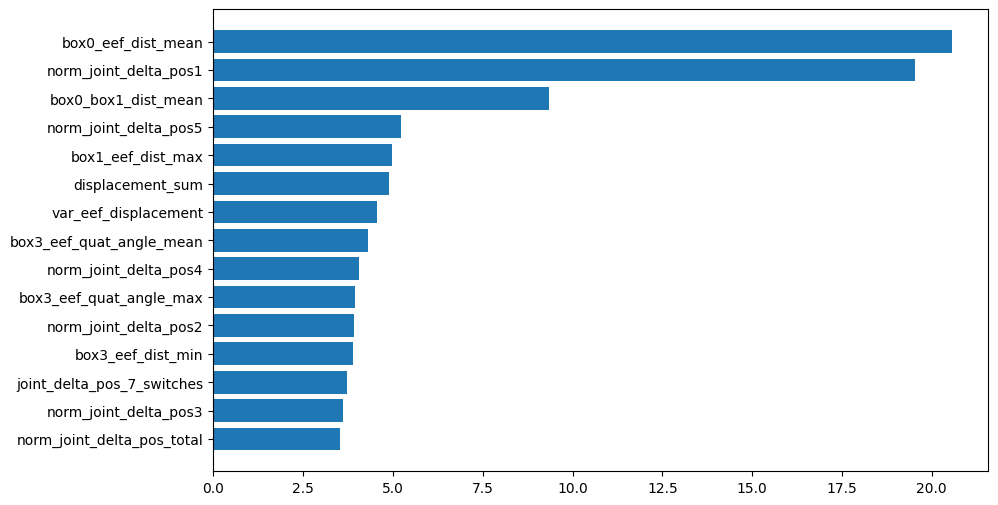

In [75]:
import matplotlib.pyplot as plt

feature_importances = catboost.get_feature_importance()
features = X_train[summary['selected_features_names']].columns

feat_imp_df = pd.DataFrame({'feature': features, 'importance': feature_importances})
feat_imp_df = feat_imp_df.sort_values(by='importance', ascending=False)

plt.figure(figsize=(10,6))
plt.barh(feat_imp_df['feature'], feat_imp_df['importance'])
plt.gca().invert_yaxis()
plt.show()


In [76]:
catboost_model = results['catboost']['model']
svm_model = results['svm']['model']



## Final results

In [77]:
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score

# Prepare lists to store results
models = []
train_r2_list = []
train_mse_list = []
test_r2_list = []
test_mse_list = []

# --- Linear model (forward selection) ---
X_train_forward = sm.add_constant(X_train[final_betas.index.values])
X_test_forward = sm.add_constant(X_test[final_betas.index.values])

forward_train_preds = final_model.predict(X_train_forward)
forward_test_preds = final_model.predict(X_test_forward)

models.append('Forward Selection')
train_r2_list.append(r2_score(y_train, forward_train_preds))
train_mse_list.append(mean_squared_error(y_train, forward_train_preds))
test_r2_list.append(r2_score(y_test, forward_test_preds))
test_mse_list.append(mean_squared_error(y_test, forward_test_preds))

# --- Lasso ---
models.append('Lasso')
train_r2_list.append(lasso_cv_model.score(X_train, y_train))
train_mse_list.append(mean_squared_error(y_train, lasso_cv_model.predict(X_train)))
test_r2_list.append(lasso_cv_model.score(X_test, y_test))
test_mse_list.append(mean_squared_error(y_test, lasso_cv_model.predict(X_test)))

# --- Ridge ---
models.append('Ridge')
train_r2_list.append(ridge_cv_model.score(X_train, y_train))
train_mse_list.append(mean_squared_error(y_train, ridge_cv_model.predict(X_train)))
test_r2_list.append(ridge_cv_model.score(X_test, y_test))
test_mse_list.append(mean_squared_error(y_test, ridge_cv_model.predict(X_test)))

# --- Random Forest ---
y_train_rf = rf_sqrt.predict(X_train)
y_test_rf = rf_sqrt.predict(X_test)

models.append('Random Forest')
train_r2_list.append(r2_score(y_train, y_train_rf))
train_mse_list.append(mean_squared_error(y_train, y_train_rf))
test_r2_list.append(r2_score(y_test, y_test_rf))
test_mse_list.append(mean_squared_error(y_test, y_test_rf))

# --- SVM ---
y_train_svm = svm_model.predict(X_train)
y_test_svm = svm_model.predict(X_test)

models.append('SVM')
train_r2_list.append(r2_score(y_train, y_train_svm))
train_mse_list.append(mean_squared_error(y_train, y_train_svm))
test_r2_list.append(r2_score(y_test, y_test_svm))
test_mse_list.append(mean_squared_error(y_test, y_test_svm))

# --- CatBoost ---
y_train_cb = catboost.predict(X_train[summary['selected_features_names']])
y_test_cb = catboost.predict(X_test[summary['selected_features_names']])

models.append('CatBoost')
train_r2_list.append(r2_score(y_train, y_train_cb))
train_mse_list.append(mean_squared_error(y_train, y_train_cb))
test_r2_list.append(r2_score(y_test, y_test_cb))
test_mse_list.append(mean_squared_error(y_test, y_test_cb))

# --- Build final report ---
report = pd.DataFrame({
    'Model': models,
    'Train R²': train_r2_list,
    'Train MSE': train_mse_list,
    'Test R²': test_r2_list,
    'Test MSE': test_mse_list,
})

# Pretty print
print(report.to_string(index=False))


            Model  Train R²  Train MSE  Test R²  Test MSE
Forward Selection  0.632830   0.028785 0.516424  0.035929
            Lasso  0.626541   0.029278 0.531344  0.034821
            Ridge  0.645148   0.027819 0.535096  0.034542
    Random Forest  0.950385   0.003890 0.567642  0.032124
              SVM  0.842501   0.012347 0.555529  0.033024
         CatBoost  0.872702   0.009980 0.610103  0.028969


In [78]:
report # without logged

,Model,Train R²,Train MSE,Test R²,Test MSE
0,Forward Selection,0.632830,0.028785,0.516424,0.035929
1,Lasso,0.626541,0.029278,0.531344,0.034821
2,Ridge,0.645148,0.027819,0.535096,0.034542
3,Random Forest,0.950385,0.003890,0.567642,0.032124
4,SVM,0.842501,0.012347,0.555529,0.033024
5,CatBoost,0.872702,0.009980,0.610103,0.028969


In [79]:
report # with logged

,Model,Train R²,Train MSE,Test R²,Test MSE
0,Forward Selection,0.632830,0.028785,0.516424,0.035929
1,Lasso,0.626541,0.029278,0.531344,0.034821
2,Ridge,0.645148,0.027819,0.535096,0.034542
3,Random Forest,0.950385,0.003890,0.567642,0.032124
4,SVM,0.842501,0.012347,0.555529,0.033024
5,CatBoost,0.872702,0.009980,0.610103,0.028969


#Classification Task

In [80]:
df.shape

(799, 43)

In [81]:
df.columns

Index(['max_of_timestamp', 'displacement_sum', 'var_eef_displacement',
       'norm_joint_delta_pos1', 'norm_joint_delta_pos2',
       'norm_joint_delta_pos3', 'norm_joint_delta_pos4',
       'norm_joint_delta_pos5', 'norm_joint_delta_pos6',
       'norm_joint_delta_pos_total', 'joint_delta_pos_7_switches',
       'box0_eef_dist_mean', 'box0_eef_dist_max', 'box1_eef_dist_mean',
       'box1_eef_dist_max', 'box2_eef_dist_mean', 'box2_eef_dist_max',
       'box3_eef_dist_mean', 'box3_eef_dist_min', 'box3_eef_dist_max',
       'box0_eef_quat_angle_mean', 'box0_eef_quat_angle_min',
       'box0_eef_quat_angle_max', 'box1_eef_quat_angle_mean',
       'box1_eef_quat_angle_min', 'box1_eef_quat_angle_max',
       'box2_eef_quat_angle_mean', 'box2_eef_quat_angle_min',
       'box2_eef_quat_angle_max', 'box3_eef_quat_angle_mean',
       'box3_eef_quat_angle_min', 'box3_eef_quat_angle_max',
       'box0_box1_dist_mean', 'box0_box2_dist_mean', 'box0_box3_dist_mean',
       'box0_box3_dist_min', 'b

(array([ 1.,  0.,  0.,  0.,  0.,  1.,  7.,  8., 17., 24., 36., 47., 46.,
        57., 54., 48., 45., 46., 42., 36., 32., 37., 29., 29., 17., 19.,
        18., 26., 15., 12., 11.,  6.,  8.,  8.,  2.,  4.,  5.,  2.,  1.,
         3.]),
 array([0.26236426, 0.30372822, 0.34509218, 0.38645614, 0.4278201 ,
        0.46918406, 0.51054802, 0.55191198, 0.59327593, 0.63463989,
        0.67600385, 0.71736781, 0.75873177, 0.80009573, 0.84145969,
        0.88282364, 0.9241876 , 0.96555156, 1.00691552, 1.04827948,
        1.08964344, 1.1310074 , 1.17237136, 1.21373531, 1.25509927,
        1.29646323, 1.33782719, 1.37919115, 1.42055511, 1.46191907,
        1.50328303, 1.54464698, 1.58601094, 1.6273749 , 1.66873886,
        1.71010282, 1.75146678, 1.79283074, 1.83419469, 1.87555865,
        1.91692261]),
 <BarContainer object of 40 artists>)

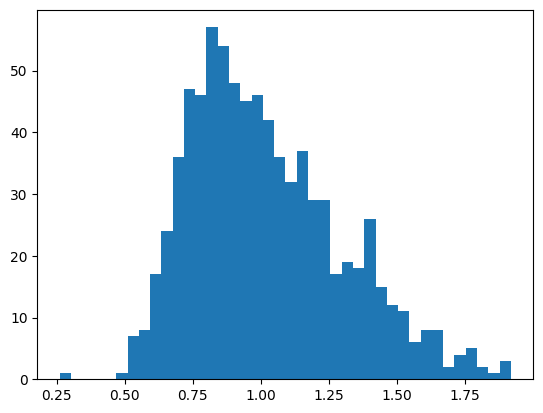

In [82]:
plt.hist(df['logged_max_of_timestamp'], bins = 40)

In [83]:
median_timestamp = df['logged_max_of_timestamp'].median()

In [84]:
df['Class'] = (df['logged_max_of_timestamp'] > median_timestamp).astype(int)

In [85]:
counts = df['Class'].value_counts()
counts

,count
Class,
0,404
1,395


In [86]:
df.groupby('Class').mean().T.head(10)  # Transposed for easier reading

Class,0,1
max_of_timestamp,2.235809,3.552996
displacement_sum,0.275658,-0.281939
var_eef_displacement,0.320268,-0.327565
norm_joint_delta_pos1,0.438300,-0.448286
norm_joint_delta_pos2,-0.297631,0.304412
norm_joint_delta_pos3,0.002182,-0.002232
norm_joint_delta_pos4,-0.072603,0.074257
norm_joint_delta_pos5,0.176998,-0.181031
norm_joint_delta_pos6,-0.180501,0.184614
norm_joint_delta_pos_total,0.032039,-0.032769


In [87]:
correlations = df.drop(columns=['max_of_timestamp', 'logged_max_of_timestamp']).corr()['Class'].sort_values(ascending=False)

In [88]:
top_features = correlations[correlations.index != 'Class'].abs().sort_values(ascending=False).head(10).index

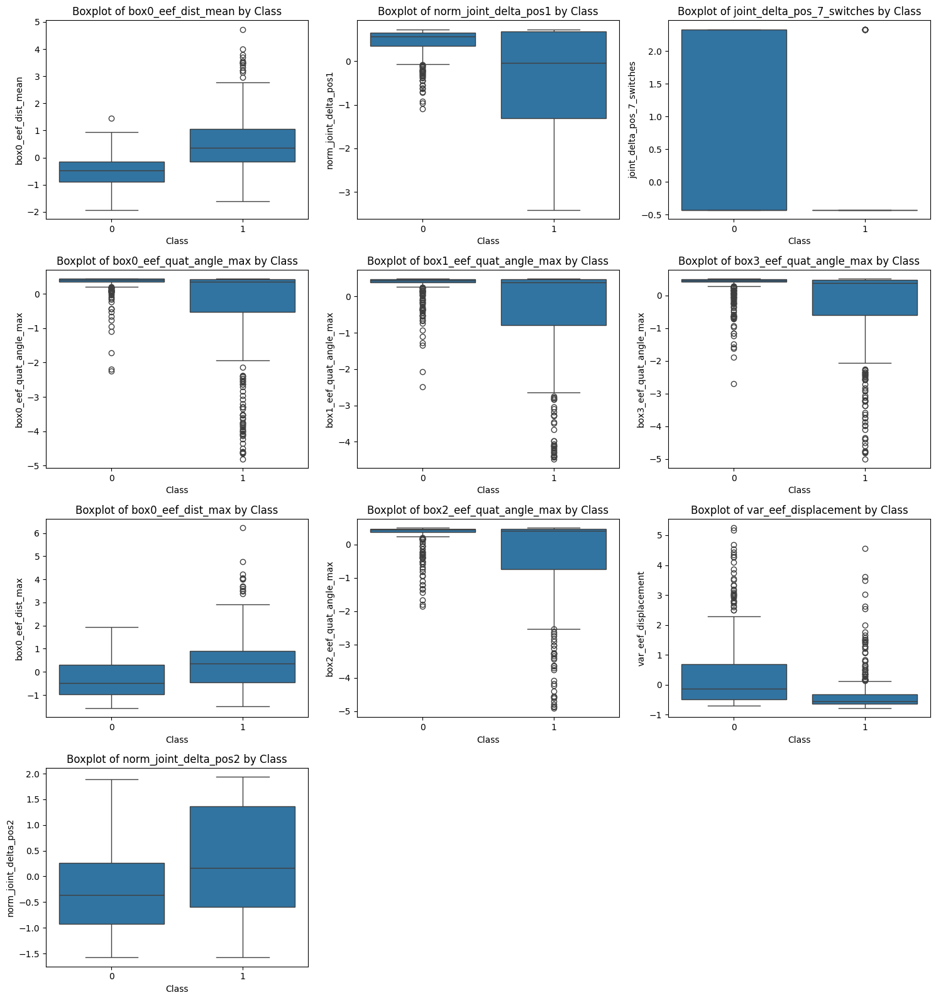

In [89]:
# Plot configuration
n_features = len(top_features)
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

# Plot each boxplot
for i, feature in enumerate(top_features):
    sns.boxplot(x='Class', y=feature, data=df, ax=axes[i])
    axes[i].set_title(f"Boxplot of {feature} by Class")

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


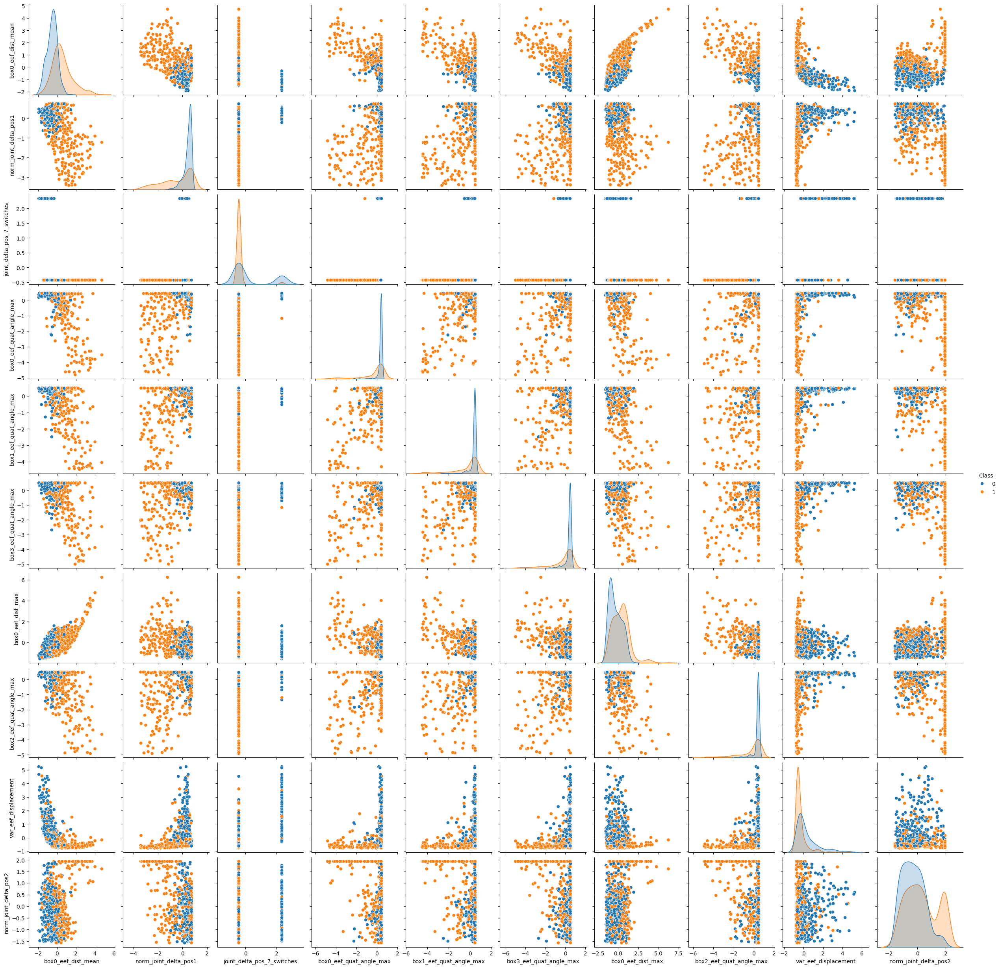

In [90]:
sns.pairplot(df, vars=top_features, hue='Class')

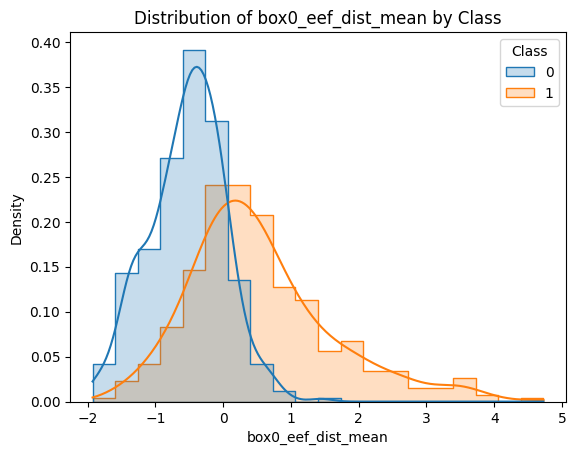

In [91]:
feature = top_features[0]

sns.histplot(data=df, x=feature, hue='Class', kde=True, bins=20, element="step", stat="density")
plt.title(f"Distribution of {feature} by Class")
plt.show()

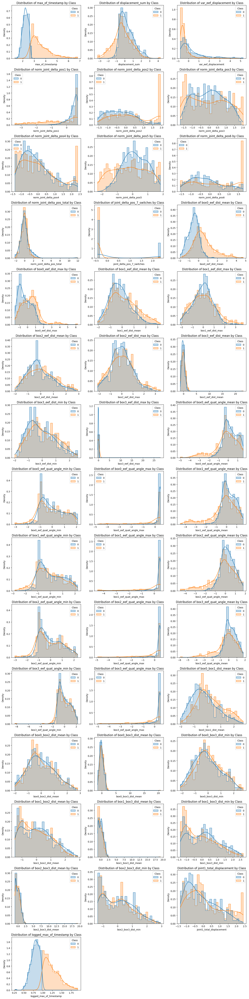

In [92]:
# Define features to plot (all numeric features excluding ID/target)
features = df.drop(columns=['sum_of_timestamp', 'Class', 'episode_index'], errors='ignore').select_dtypes(include=np.number).columns

# Subplot configuration
n_features = len(features)
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()  # Flatten to 1D array for easy indexing

# Plot each feature
for i, feature in enumerate(features):
    sns.histplot(data=df, x=feature, hue='Class', kde=True, bins=30,
                 element="step", stat="density", ax=axes[i])
    axes[i].set_title(f"Distribution of {feature} by Class")

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [93]:
y = df['Class']
X = df.drop(columns=['max_of_timestamp', 'Class', 'episode_index', 'logged_max_of_timestamp'], errors='ignore')

In [94]:
X.shape

(799, 41)

In [95]:
feature_names = X.columns.tolist()
feature_names

['displacement_sum',
 'var_eef_displacement',
 'norm_joint_delta_pos1',
 'norm_joint_delta_pos2',
 'norm_joint_delta_pos3',
 'norm_joint_delta_pos4',
 'norm_joint_delta_pos5',
 'norm_joint_delta_pos6',
 'norm_joint_delta_pos_total',
 'joint_delta_pos_7_switches',
 'box0_eef_dist_mean',
 'box0_eef_dist_max',
 'box1_eef_dist_mean',
 'box1_eef_dist_max',
 'box2_eef_dist_mean',
 'box2_eef_dist_max',
 'box3_eef_dist_mean',
 'box3_eef_dist_min',
 'box3_eef_dist_max',
 'box0_eef_quat_angle_mean',
 'box0_eef_quat_angle_min',
 'box0_eef_quat_angle_max',
 'box1_eef_quat_angle_mean',
 'box1_eef_quat_angle_min',
 'box1_eef_quat_angle_max',
 'box2_eef_quat_angle_mean',
 'box2_eef_quat_angle_min',
 'box2_eef_quat_angle_max',
 'box3_eef_quat_angle_mean',
 'box3_eef_quat_angle_min',
 'box3_eef_quat_angle_max',
 'box0_box1_dist_mean',
 'box0_box2_dist_mean',
 'box0_box3_dist_mean',
 'box0_box3_dist_min',
 'box1_box2_dist_mean',
 'box1_box3_dist_mean',
 'box1_box3_dist_min',
 'box2_box3_dist_mean',
 'bo

In [96]:
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Bagging with Decision Tree
bag = BaggingClassifier(estimator=DecisionTreeClassifier(),
                        n_estimators=100,
                        bootstrap=True,
                        oob_score=True,
                        random_state=42)
bag.fit(X_train, y_train)
y_pred_bag = bag.predict(X_test)

# Random Forest
rf = RandomForestClassifier(n_estimators=100, bootstrap=True, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

In [97]:
from sklearn.svm import SVC

# Train Linear SVM
svm_linear = SVC(kernel='linear', random_state=42)
svm_linear.fit(X, y)
y_pred_svm = svm_linear.predict(X_test)

# Extract weights and bias
w = svm_linear.coef_[0]
b = svm_linear.intercept_[0]
feature_names = X.columns.tolist()

# Print the linear decision function
terms = [f"{w[i]:+0.3f}·x{i+1}" for i in range(len(w))]
equation = " + ".join(terms) + f" {b:+.3f}"
print("\nLinear SVM Decision Function:")
print(f"f(x) = {equation}")

# Feature explanation table
print("\n🧾 Feature Explanation Table:")
print(f"{'xᵢ':<5} {'Feature Name':<40} {'Weight':>10}")
print("-" * 60)
for i, (name, coef) in enumerate(zip(feature_names, w)):
    print(f"x{i+1:<3} {name:<40} {coef:>+10.4f}")



Linear SVM Decision Function:
f(x) = -0.831·x1 + +0.107·x2 + -1.053·x3 + +0.263·x4 + -0.089·x5 + +0.093·x6 + +0.307·x7 + -0.253·x8 + +0.434·x9 + -0.239·x10 + +1.340·x11 + +0.319·x12 + +0.181·x13 + -0.357·x14 + -0.542·x15 + +0.470·x16 + -0.426·x17 + +0.163·x18 + +0.481·x19 + -0.052·x20 + +0.117·x21 + -0.088·x22 + +0.633·x23 + -0.332·x24 + -0.302·x25 + +0.246·x26 + -0.001·x27 + -0.763·x28 + -0.097·x29 + +0.135·x30 + -0.340·x31 + +0.557·x32 + +0.059·x33 + +0.083·x34 + +0.060·x35 + +0.014·x36 + -0.060·x37 + -0.081·x38 + +0.000·x39 + +0.000·x40 + +0.185·x41 +0.742

🧾 Feature Explanation Table:
xᵢ    Feature Name                                 Weight
------------------------------------------------------------
x1   displacement_sum                            -0.8306
x2   var_eef_displacement                        +0.1071
x3   norm_joint_delta_pos1                       -1.0527
x4   norm_joint_delta_pos2                       +0.2635
x5   norm_joint_delta_pos3                       -0.0892

In [101]:
from sklearn.ensemble import GradientBoostingClassifier


# Gradient Boosting
gb = GradientBoostingClassifier(n_estimators=100, # Number of boosting stages (trees)
                                learning_rate=0.1, # Step size shrinkage
                                max_depth=3, # Maximum depth of individual trees
                                random_state=42)
gb.fit(X_train, y_train)
y_pred_gb = gb.predict(X_test)

In [102]:
# Print results
print(f"Accuracy - Bagging: {accuracy_score(y_test, y_pred_bag):.2%}")
print(f"OOB Score - Bagging: {bag.oob_score_:.2%}")
print(f"Accuracy - Random Forest: {accuracy_score(y_test, y_pred_rf):.2%}")
print(f"Accuracy - SVM: {accuracy_score(y_test, y_pred_svm):.2%}")
print(f"Gradient Boosting Accuracy: {accuracy_score(y_test, y_pred_gb):.2%}")

Accuracy - Bagging: 79.50%
OOB Score - Bagging: 81.14%
Accuracy - Random Forest: 80.50%
Accuracy - SVM: 83.50%
Gradient Boosting Accuracy: 80.00%


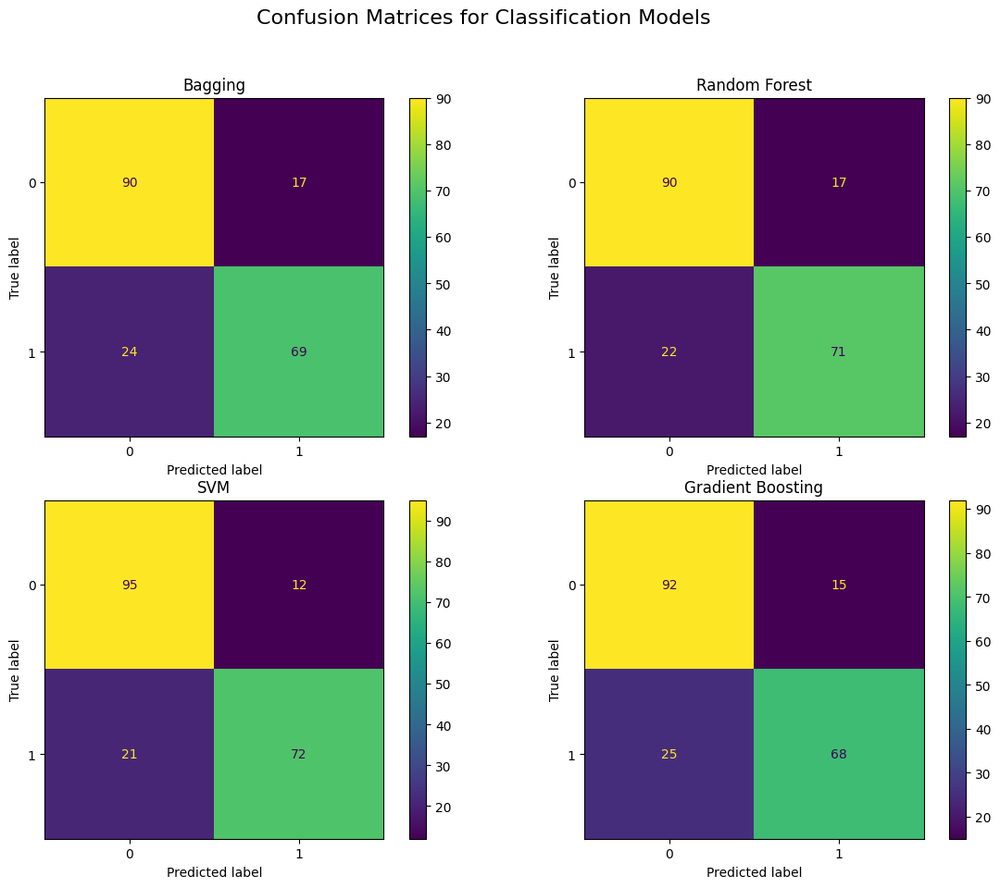

In [103]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, confusion_matrix

# Plot confusion matrices in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(12, 10)) # Changed to 2x2 subplots with adjusted figsize
fig.suptitle("Confusion Matrices for Classification Models", fontsize=16) # Increased font size for title

# Bagging (Top-left)
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_bag), display_labels=[0, 1]).plot(ax=axes[0, 0], values_format='d')
axes[0, 0].set_title("Bagging")

# Random Forest (Top-right)
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_rf), display_labels=[0, 1]).plot(ax=axes[0, 1], values_format='d')
axes[0, 1].set_title("Random Forest")

# SVM (Bottom-left)
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_svm), display_labels=[0, 1]).plot(ax=axes[1, 0], values_format='d')
axes[1, 0].set_title("SVM")

# Gradient Boosting (Bottom-right)
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_gb), display_labels=[0, 1]).plot(ax=axes[1, 1], values_format='d')
axes[1, 1].set_title("Gradient Boosting")

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust rect to prevent title overlap
plt.show()

In [105]:
metrics = {}

metrics['Bagging'] = {
    'Accuracy': accuracy_score(y_test, y_pred_bag),
    'Precision': precision_score(y_test, y_pred_bag),
    'Recall': recall_score(y_test, y_pred_bag),
    'F1-Score': f1_score(y_test, y_pred_bag)
}

metrics['Random Forest'] = {
    'Accuracy': accuracy_score(y_test, y_pred_rf),
    'Precision': precision_score(y_test, y_pred_rf),
    'Recall': recall_score(y_test, y_pred_rf),
    'F1-Score': f1_score(y_test, y_pred_rf)
}

metrics['SVM'] = {
    'Accuracy': accuracy_score(y_test, y_pred_svm),
    'Precision': precision_score(y_test, y_pred_svm),
    'Recall': recall_score(y_test, y_pred_svm),
    'F1-Score': f1_score(y_test, y_pred_svm)
}

metrics['Gradient Boosting'] = {
    'Accuracy': accuracy_score(y_test, y_pred_gb),
    'Precision': precision_score(y_test, y_pred_gb),
    'Recall': recall_score(y_test, y_pred_gb),
    'F1-Score': f1_score(y_test, y_pred_gb)
}

metrics_df = pd.DataFrame.from_dict(metrics, orient='index')

print("\n--- Classification Model Performance Metrics ---")
print(metrics_df.round(4))

NameError: name 'precision_score' is not defined

In [106]:
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np


# Define SVM kernels to test
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# Setup cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate each kernel
for kernel in kernels:
    print(f"\n🔍 SVM Kernel: {kernel.upper()}")

    # Initialize model
    if kernel == 'poly':
        model = SVC(kernel=kernel, degree=3)
    else:
        model = SVC(kernel=kernel)

    # Cross-validated accuracy
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    print(f"→ Accuracy scores: {np.round(scores, 4)}")
    print(f"→ Mean accuracy: {scores.mean():.4f}")
    print(f"→ Std deviation: {scores.std():.4f}")

    # 🔁 Refit on full data to inspect hyperplane / support vectors
    model.fit(X, y)

    if kernel == 'linear':
        w = model.coef_[0]
        b = model.intercept_[0]
        print(f"→ Linear hyperplane equation:")
        terms = [f"{w[i]:+.3f}·x{i+1}" for i in range(len(w))]
        equation = " + ".join(terms) + f" {b:+.3f}"
        print(f"f(x) = {equation}")

    else:
        sv = model.support_vectors_
        dual_coefs = model.dual_coef_[0]
        intercept = model.intercept_[0]
        n_sv = len(sv)

        print(f"→ Number of support vectors: {n_sv}")
        print(f"→ Intercept (b): {intercept:.3f}")
        print("→ Decision function structure:")

        if kernel == 'rbf':
            print(r"f(x) = Σ αᵢ·yᵢ·exp(-γ·||xᵢ - x||²) + b")
        elif kernel == 'poly':
            print(r"f(x) = Σ αᵢ·yᵢ·(γ·xᵢᵗ·x + coef0)^degree + b")
        elif kernel == 'sigmoid':
            print(r"f(x) = Σ αᵢ·yᵢ·tanh(γ·xᵢᵗ·x + coef0) + b")
        print("  (evaluated using support vectors)")


🔍 SVM Kernel: LINEAR
→ Accuracy scores: [0.7625 0.7812 0.85   0.825  0.8491]
→ Mean accuracy: 0.8136
→ Std deviation: 0.0357
→ Linear hyperplane equation:
f(x) = -0.831·x1 + +0.107·x2 + -1.053·x3 + +0.263·x4 + -0.089·x5 + +0.093·x6 + +0.307·x7 + -0.253·x8 + +0.434·x9 + -0.239·x10 + +1.340·x11 + +0.319·x12 + +0.181·x13 + -0.357·x14 + -0.542·x15 + +0.470·x16 + -0.426·x17 + +0.163·x18 + +0.481·x19 + -0.052·x20 + +0.117·x21 + -0.088·x22 + +0.633·x23 + -0.332·x24 + -0.302·x25 + +0.246·x26 + -0.001·x27 + -0.763·x28 + -0.097·x29 + +0.135·x30 + -0.340·x31 + +0.557·x32 + +0.059·x33 + +0.083·x34 + +0.060·x35 + +0.014·x36 + -0.060·x37 + -0.081·x38 + +0.000·x39 + +0.000·x40 + +0.185·x41 +0.742

🔍 SVM Kernel: RBF
→ Accuracy scores: [0.775  0.7938 0.8375 0.8625 0.8428]
→ Mean accuracy: 0.8223
→ Std deviation: 0.0326
→ Number of support vectors: 459
→ Intercept (b): 0.843
→ Decision function structure:
f(x) = Σ αᵢ·yᵢ·exp(-γ·||xᵢ - x||²) + b
  (evaluated using support vectors)

🔍 SVM Kernel: POLY
→ A

In [107]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np

# Use your real dataset
y = df['Class']
X = df.drop(columns=['max_of_timestamp', 'Class', 'episode_index', 'logged_max_of_timestamp'], errors='ignore')
feature_names = X.columns.tolist()

# Define SVM kernels to test
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# Setup cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate each kernel
for kernel in kernels:
    print(f"\n🔍 SVM Kernel: {kernel.upper()}")

    # Initialize model
    if kernel == 'poly':
        model = SVC(kernel=kernel, degree=3)
    else:
        model = SVC(kernel=kernel)

    # Cross-validated accuracy
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    print(f"→ Accuracy scores: {np.round(scores, 4)}")
    print(f"→ Mean accuracy: {scores.mean():.4f}")
    print(f"→ Std deviation: {scores.std():.4f}")

    # 🔁 Refit on full data to extract interpretation info
    model.fit(X, y)

    if kernel == 'linear':
        # Linear hyperplane: wᵀx + b
        w = model.coef_[0]
        b = model.intercept_[0]
        print(f"\n→ Linear hyperplane equation:")
        terms = [f"{w[i]:+.3f}·x{i+1}" for i in range(len(w))]
        equation = " + ".join(terms) + f" {b:+.3f}"
        print(f"f(x) = {equation}")

        # Print feature explanation table
        print("\n🧾 Feature Explanation Table:")
        print(f"{'xᵢ':<5} {'Feature Name':<40}")
        print("-" * 50)
        for i, name in enumerate(feature_names):
            print(f"x{i+1:<3} {name:<40}")

    else:
        # Nonlinear SVM: kernel-based decision function
        sv = model.support_vectors_
        dual_coefs = model.dual_coef_[0]
        intercept = model.intercept_[0]
        n_sv = len(sv)

        print(f"→ Number of support vectors: {n_sv}")
        print(f"→ Intercept (b): {intercept:.3f}")
        print("→ Decision function structure:")

        if kernel == 'rbf':
            print(r"f(x) = Σ αᵢ·yᵢ·exp(-γ·||xᵢ - x||²) + b")
        elif kernel == 'poly':
            print(r"f(x) = Σ αᵢ·yᵢ·(γ·xᵢᵗ·x + coef0)^degree + b")
        elif kernel == 'sigmoid':
            print(r"f(x) = Σ αᵢ·yᵢ·tanh(γ·xᵢᵗ·x + coef0) + b")
        print("  (evaluated using support vectors)")



🔍 SVM Kernel: LINEAR
→ Accuracy scores: [0.7625 0.7812 0.85   0.825  0.8491]
→ Mean accuracy: 0.8136
→ Std deviation: 0.0357

→ Linear hyperplane equation:
f(x) = -0.831·x1 + +0.107·x2 + -1.053·x3 + +0.263·x4 + -0.089·x5 + +0.093·x6 + +0.307·x7 + -0.253·x8 + +0.434·x9 + -0.239·x10 + +1.340·x11 + +0.319·x12 + +0.181·x13 + -0.357·x14 + -0.542·x15 + +0.470·x16 + -0.426·x17 + +0.163·x18 + +0.481·x19 + -0.052·x20 + +0.117·x21 + -0.088·x22 + +0.633·x23 + -0.332·x24 + -0.302·x25 + +0.246·x26 + -0.001·x27 + -0.763·x28 + -0.097·x29 + +0.135·x30 + -0.340·x31 + +0.557·x32 + +0.059·x33 + +0.083·x34 + +0.060·x35 + +0.014·x36 + -0.060·x37 + -0.081·x38 + +0.000·x39 + +0.000·x40 + +0.185·x41 +0.742

🧾 Feature Explanation Table:
xᵢ    Feature Name                            
--------------------------------------------------
x1   displacement_sum                        
x2   var_eef_displacement                    
x3   norm_joint_delta_pos1                   
x4   norm_joint_delta_pos2               

In [108]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np
import pandas as pd # Import pandas if df is not globally available

# Use your real dataset
# Ensure 'Class' is your target variable. If it's 'is_above_median', adjust here.
X = df.drop(columns=['max_of_timestamp', 'Class', 'episode_index', 'logged_max_of_timestamp'], errors='ignore')
y = df['Class']
feature_names = X.columns.tolist()


# Setup cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# --- Gradient Boosting Classifier ---
print("\n=== Gradient Boosting Classifier ===")

# Initialize the Gradient Boosting model
# Common hyperparameters to start with:
# n_estimators: number of boosting stages (trees)
# learning_rate: shrinks the contribution of each tree
# max_depth: maximum depth of the individual regression estimators
model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Cross-validated accuracy
scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
print(f"\n→ Accuracy scores (Cross-Validation): {np.round(scores, 4)}")
print(f"→ Mean accuracy: {scores.mean():.4f}")
print(f"→ Std deviation: {scores.std():.4f}")

# 🔁 Refit on full data to extract interpretation info (e.g., Feature Importances)
model.fit(X, y)

# --- Interpretability for Gradient Boosting ---
# Gradient Boosting models provide feature importances, which indicate the
# relative importance of each feature in predicting the target variable.
feature_importances = model.feature_importances_

# Create a DataFrame for better display
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Sort by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print("\n📊 Feature Importances (Higher is more important):")
print(importance_df)

# You can also visualize these importances, for example:
# import matplotlib.pyplot as plt
# import seaborn as sns
# plt.figure(figsize=(10, 6))
# sns.barplot(x='Importance', y='Feature', data=importance_df)
# plt.title('Feature Importances for Gradient Boosting Classifier')
# plt.tight_layout()
# plt.show()


=== Gradient Boosting Classifier ===

→ Accuracy scores (Cross-Validation): [0.7875 0.7812 0.8062 0.8625 0.8491]
→ Mean accuracy: 0.8173
→ Std deviation: 0.0327

📊 Feature Importances (Higher is more important):
                       Feature  Importance
10          box0_eef_dist_mean    0.383021
2        norm_joint_delta_pos1    0.156915
31         box0_box1_dist_mean    0.059280
8   norm_joint_delta_pos_total    0.039409
30     box3_eef_quat_angle_max    0.030637
6        norm_joint_delta_pos5    0.026969
0             displacement_sum    0.021015
27     box2_eef_quat_angle_max    0.019531
3        norm_joint_delta_pos2    0.019173
1         var_eef_displacement    0.016376
12          box1_eef_dist_mean    0.015852
40   joint1_total_displacement    0.015164
21     box0_eef_quat_angle_max    0.014837
9   joint_delta_pos_7_switches    0.014546
20     box0_eef_quat_angle_min    0.014542
5        norm_joint_delta_pos4    0.012426
24     box1_eef_quat_angle_max    0.011454
7        norm

TODO List:

- check a code of the other group
- SVM
- gradient boosting
- log(target)
- write a report (PDF) and upload it
- collect together classification and regression task.
- make it more pretty
- maybe add some analysis and features (if have ideas)
-